# Projet 3 : Concevez une application au service de la santé publique

## Appel à projets pour trouver des idées innovantes d’applications en lien avec l'alimentation pour Santé Publique France

**Application :**

L’application est nommée "*RegAl*".

Avec un simple scan du code barre, elle permet de déterminer si un produit est adapté ou non à un certain régime alimentaire préalablement renseigné dans l’application. Elle peut également conseiller des produits de la même catégorie qui seraient plus adaptés au régime choisi.
Elle permet ainsi aux personnes suivants des régimes alimentaires particuliers de pouvoir sélectionner leurs produits plus facilement. 

Exemple de choix de régimes :
-	Régime sans gluten
-	Régime sans sel 
-	Régime sportif (beaucoup de protéines)
-   Régime sans sucres
-   Régime sans gras
-   Régime riche en fibres 



## Analyse des données

<a id="0"></a> <br>
# Table of Contents 

1. [Analyse univariée](#1) 
    * [1.1 Données quantitatives](#2)
        * [1.1.a Describe()](#3)
        * [1.1.b Boxplots](#4)
        * [1.1.c Distribution](#5)
        * [1.1.d Coefficients d'asymétrie et d'aplatissement](#6)
        * [1.1.e QQ-plots](#7)
        * [1.1.f Tests de normalité](#8)
    * [1.2 Données qualitatives](#9)
        * [1.2.a Bar plots](#10)
        * [1.2.b Occurrence de mots](#11)
        * [1.2.c Pie plots](#12)

1. [Analyse bivariée](#13)
    * [2.1 Relation entre 2 variables quantitatives : les valeurs nutritionnelles et le nutriscore](#14)
    * [2.2 Relation entre 1 variable quantitative et 1 variable qualitative](#15)
        * [2.2.a Le nutrigrade et les valeurs nutritionnelles](#16)
        * [2.2.b Les catégories et les valeurs nutritionnelles](#17)
    * [2.3 Relation entre 2 variables qualitatives](#18)
        * [2.3.a Le nutrigrade et les catégories](#19)
        * [2.3.b Les traces et les catégories](#20)
        
1. [Analyse multivariée](#21) 
    * [3.1 ACP (Analyse en Composantes Principales)](#22) 

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import shapiro, anderson, kstest, normaltest
import collections
from scipy.stats import pearsonr, spearmanr, kendalltau, kruskal, chi2_contingency
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import fonctions as fc
from mpl_toolkits.mplot3d import axes3d
import importlib

In [9]:
importlib.reload(fc)

<module 'fonctions' from '/Users/oceaneyouyoutte/Desktop/Data Science/OCR/Projet 3/a zip/fonctions.py'>

In [10]:
# Paramètres d'affichage
pd.options.display.max_rows = 200
pd.options.display.max_columns = 200

In [11]:
data = pd.read_csv('data_openfoodfacts_cleaned.csv')

In [12]:
data_original = data.copy()

In [13]:
data.head()

,code,product_name,nutrigrade,categories,sub_categories,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutriscore,traces,palm_oil
0,36252,Lion Peanut x2,e,unknown,unknown,1883.0,20.00,12.50,70.00,57.50,2.5,2.50,0.10,0.04,22.0,aucune,0
1,39529,Pack de 2 Twix,c,unknown,unknown,1481.0,4.17,1.51,77.08,39.42,6.2,6.25,1.16,0.46,9.2,aucune,0
2,10207260,Praliné Amande Et Noisette,d,unknown,unknown,2406.0,9.47,2.90,64.49,50.30,3.9,9.50,0.00,0.00,14.0,aucune,0
3,40608754,"Pepsi, Nouveau goût !",e,beverages,sweetened beverages,177.0,0.00,0.00,10.40,10.40,0.0,0.00,0.03,0.01,13.0,aucune,0
4,69161025,Tarte Poireaux Et Lardons,d,unknown,unknown,1079.0,22.37,11.00,16.11,1.00,1.4,7.50,0.80,0.31,15.0,aucune,1


#### Explication des variables :

- *code* : code barre, permet d'identifier les différents produits.

**Variables quantitatives :**
- *energy_100g*: énergie en kJ fournie pour 100g de produit.
- *fat_100g* : quantité de gras dans 100g de produit.
- *saturated-fat_100g* : quantité de gras saturé dans 100g de produit. Il est compris dans la valeur nutritionnelle relative au gras (*fat_100g*).
- *carbohydrates_100g*: quantité de glucides dans 100g de produit.
- *sugars_100g* : quantité de sucres dans 100g de produit.
- *fiber_100g* : quantité de fibres dans 100g de produit.
- *proteins_100g* : quantité de protéines dans 100g de produit.
- *salt_100g* : quantité de sel dans 100g de produit.            
- *sodium_100g* : quantité de sodium dans 100g de produit. Le sodium est une composante du sel.
- *nutriscore* : nutriscore déterminé pour 100g de produit.

**Variables qualitatives :**

- *product_name* : nom du produit.
- *nutrigrade* : Note de A à E, attribuée en fonction du nutriscore.
- *categories* : catégorie à laquelle appartient le produit.
- *sub_categories* : sous-catégorie à laquelle appartient le produit.
- *traces* : traces d'ingrédients potentiellement allergènes présents dans le produit.
- *palm_oil* : détermine si oui (1) ou non (0) le produit contient au moins un ingrédient provenant de l'huile de palme.

In [14]:
data.dtypes

code                    int64
product_name           object
nutrigrade             object
categories             object
sub_categories         object
energy_100g           float64
fat_100g              float64
saturated-fat_100g    float64
carbohydrates_100g    float64
sugars_100g           float64
fiber_100g            float64
proteins_100g         float64
salt_100g             float64
sodium_100g           float64
nutriscore            float64
traces                 object
palm_oil                int64
dtype: object

In [15]:
data['code'] = data['code'].astype(str)
data['palm_oil'] = data['palm_oil'].astype('category')

In [16]:
data.rename(columns = {'saturated-fat_100g':'saturated_fat_100g'},inplace = True)

In [17]:
data.shape

(63938, 17)

In [18]:
fc.missing_general(data)

Nombre total de cellules manquantes : 380
Nombre de cellules manquantes en % : 0.03%


In [19]:
fc.valeurs_manquantes(data)

,Variable,Missing values,Missing (%)
0,code,0,0.000000
1,product_name,380,0.005943
2,nutrigrade,0,0.000000
3,categories,0,0.000000
4,sub_categories,0,0.000000
5,energy_100g,0,0.000000
6,fat_100g,0,0.000000
7,saturated_fat_100g,0,0.000000
8,carbohydrates_100g,0,0.000000
9,sugars_100g,0,0.000000


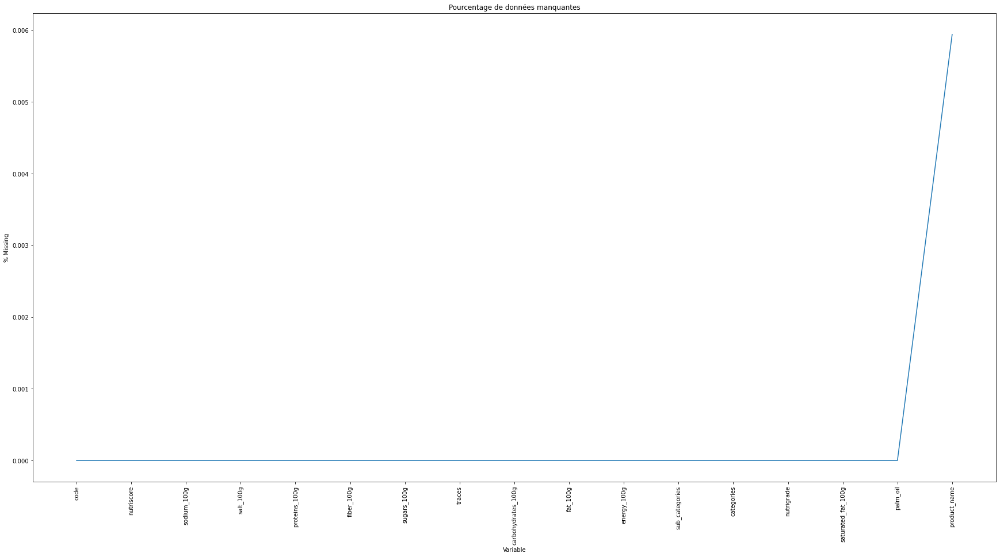

In [20]:
fc.graph_missing(data)

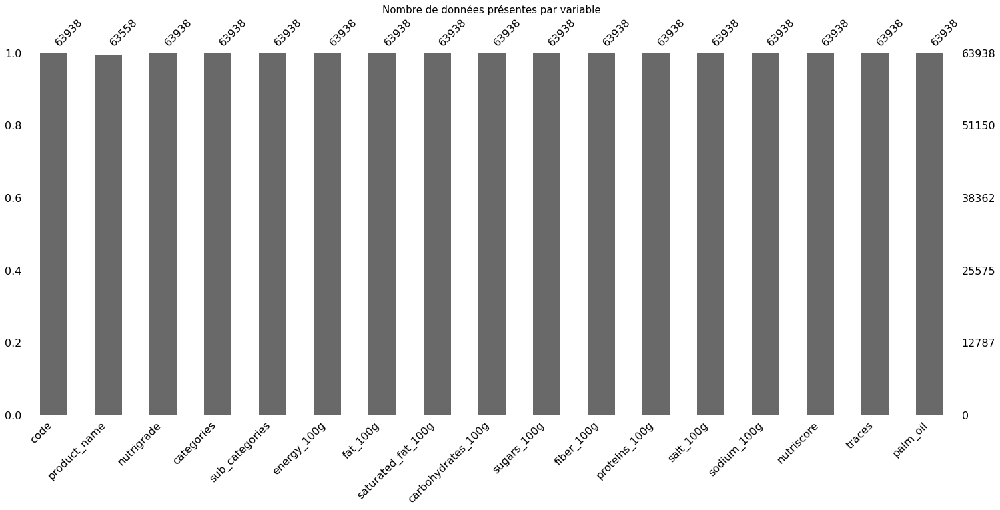

In [21]:
fc.bar_missing(data)

Après le nettoyage des données, il ne reste plus que des valeurs manquantes dans la variable *product_name*.

##  <a id="1"></a> 1. Analyse Univariée
###  <a id="2"></a> 1.1 Données quantitatives

In [22]:
variables = data.columns
col_num = data.select_dtypes(include=['int64','float64']).columns
col_val_nutri = ['fat_100g','saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 
                 'fiber_100g','proteins_100g', 'salt_100g','sodium_100g']

####  <a id="3"></a> 1.1.a Describe

In [23]:
data[col_num].describe()

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutriscore
count,63938.000000,63938.000000,63938.000000,63938.000000,63938.000000,63938.000000,63938.000000,63938.000000,63938.000000,63938.000000
mean,1089.793540,12.836387,5.052368,27.566401,12.679010,1.772112,7.741656,1.097402,0.432140,8.562845
std,751.802135,14.999526,7.443632,24.927910,17.828637,3.800728,7.546558,3.495678,1.381164,8.881577
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,421.000000,2.500000,0.300000,7.200000,1.000000,0.000000,1.900000,0.090000,0.040000,1.000000
50%,1021.000000,7.100000,1.900000,17.870000,4.000000,0.000000,6.000000,0.620000,0.240000,8.000000
75%,1625.000000,19.020000,7.000000,48.000000,16.000000,2.300000,11.000000,1.200000,0.470000,15.000000
max,3700.000000,100.000000,100.000000,100.000000,100.000000,100.000000,90.000000,100.000000,49.210000,40.000000


####  <a id="4"></a> 1.1.b Boxplots

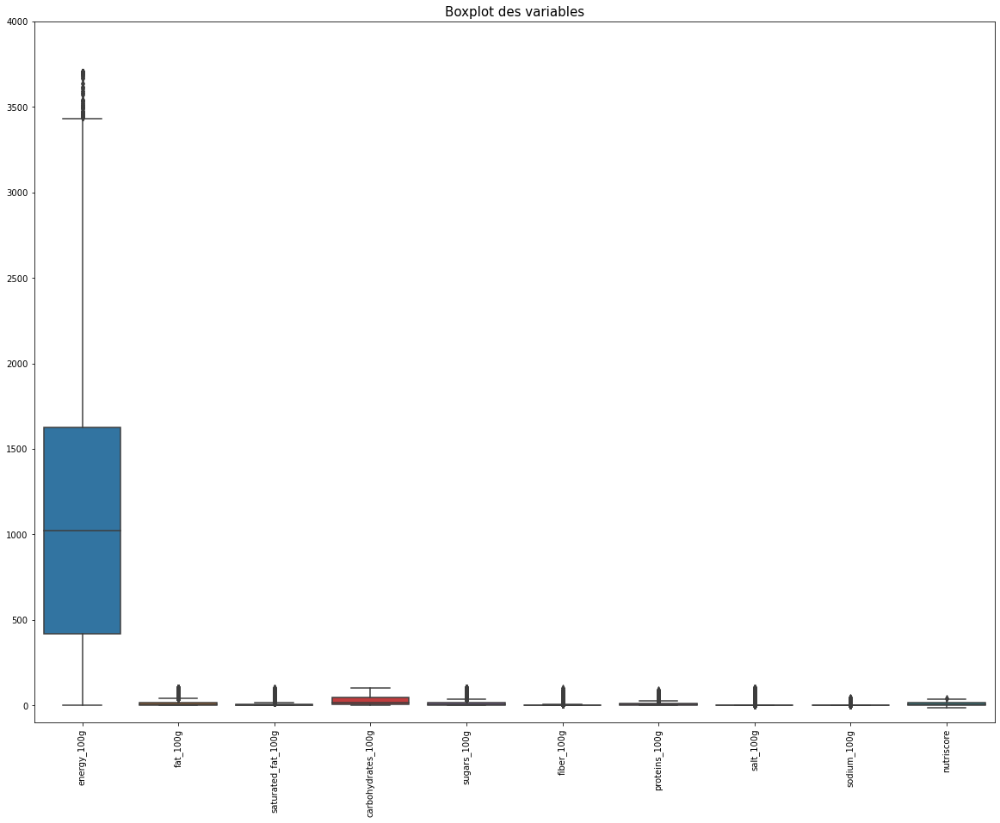

In [24]:
fc.boxplot(data[col_num],[-1e2,4e3])

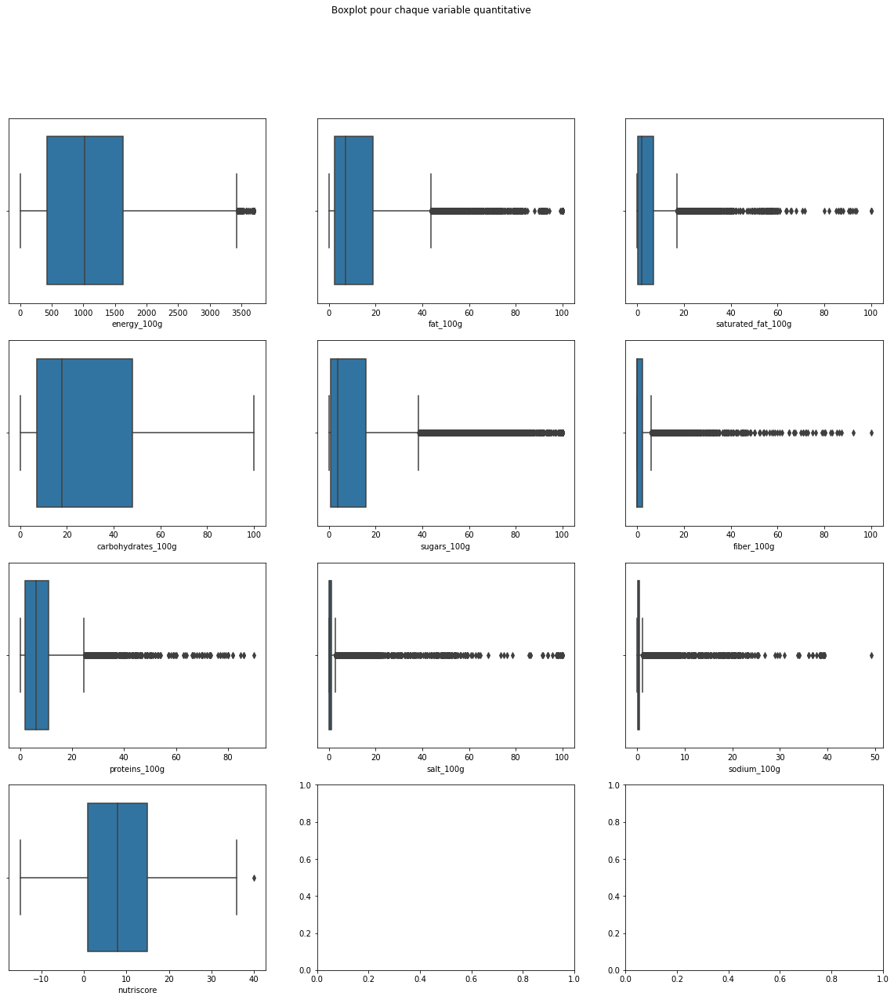

In [25]:
fc.multi_boxplot(data[col_num])

Les boxplot permettent d'observer la distribution de chaque variable. La seule variable semblant se rapprocher d'une distribution normale et le *nutriscore*. Les autres distributions sont étalées vers la droite. Pour la plupart des variables, le boxplot considère beaucoup d'observations comme étant des valeurs aberrantes. 

####  <a id="5"></a> 1.1.c Distribution

Nous allons représenter la distribution des données quantitatives ainsi que leur moyenne et leur médiane.

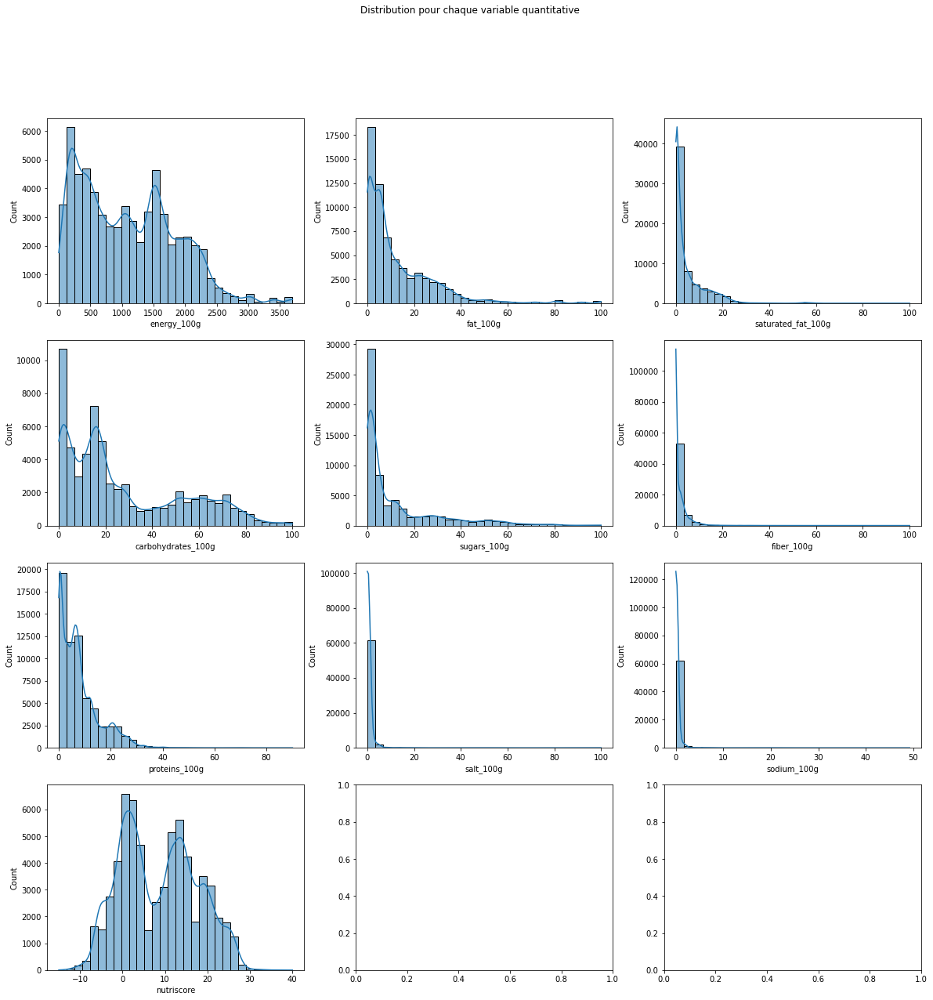

In [26]:
fc.distribution(data, col_num)

L'histogramme permet d’inspecter rapidement la forme de la distribution.
Ici, nous constatons qu'aucune de nos 10 variables ne semble avoir une distribution normale. La quasi totalité d'entre elles ont une distribution étalée à droite. 
Les variables *nutriscore*, *energy_100g* et *carbohydrates_100g* semblent présenter une distribution se rapprochant d'une distribution bimodale.

Les boxplots nous permettent également de confirmer ces premières hypothèses. 


####  <a id="6"></a> 1.1.d Coefficients d'asymétrie et d'aplatissement

La loi normale est caractérisée par un coefficient d'asymétrie et un coefficient d'aplatissement nuls. Ces indicateurs peuvent donc également nous donner une idée, ne serait-ce que très approximative, du rapprochement possible de la distribution empirique avec une gaussienne.

Nous allons donc tout d'abord étudier les indicateurs d'asymétrie (*skewness*) et d'aplatissement (*kurtosis*) des variables. 

In [27]:
fc.indicateurs(data,col_num)

Étude de energy_100g :
Coefficient d'asymétrie de la variable energy_100g : 0.527
Coefficient d'aplatissement de la variable energy_100g : -0.368
----------------------------------------------------------------------
Étude de fat_100g :
Coefficient d'asymétrie de la variable fat_100g : 2.274
Coefficient d'aplatissement de la variable fat_100g : 7.361
----------------------------------------------------------------------
Étude de saturated_fat_100g :
Coefficient d'asymétrie de la variable saturated_fat_100g : 3.017
Coefficient d'aplatissement de la variable saturated_fat_100g : 16.213
----------------------------------------------------------------------
Étude de carbohydrates_100g :
Coefficient d'asymétrie de la variable carbohydrates_100g : 0.831
Coefficient d'aplatissement de la variable carbohydrates_100g : -0.508
----------------------------------------------------------------------
Étude de sugars_100g :
Coefficient d'asymétrie de la variable sugars_100g : 1.905
Coefficient d'apla

Le coefficient d'asymétrie est positif pour chacune de nos variables. Cela indique une asymétrie à gauche et donc une distribution étalée à droite. Les coefficients se rapprochant le plus de 0 sont ceux de *energy_100g*, *carbohydrates_100g* et *nutriscore*.

De nouveau, pour le coefficient d'aplatissement, aucun n'est à 0. Ceux positifs signifient que la distribution est moins aplatie qu'une distribution normale, et les négatifs signifient à l'inverse que la distribution est plus aplatie qu'une distribution normale.
Encore une fois, les coefficients se rapprochant le plus de 0 sont ceux de *energy_100g*, *carbohydrates_100g* et *nutriscore*.

Ces résultats confirment encore une fois l'hypothèse de non-normalité des distributions et une distribution étalée à droite pour la plupart de nos variables.

####  <a id="7"></a> 1.1.e QQ-plots

Nous allons également comparer la distribution des variables à celle d'une loi normale à l'aide du diagramme quantile-quantile (*qqplot*).

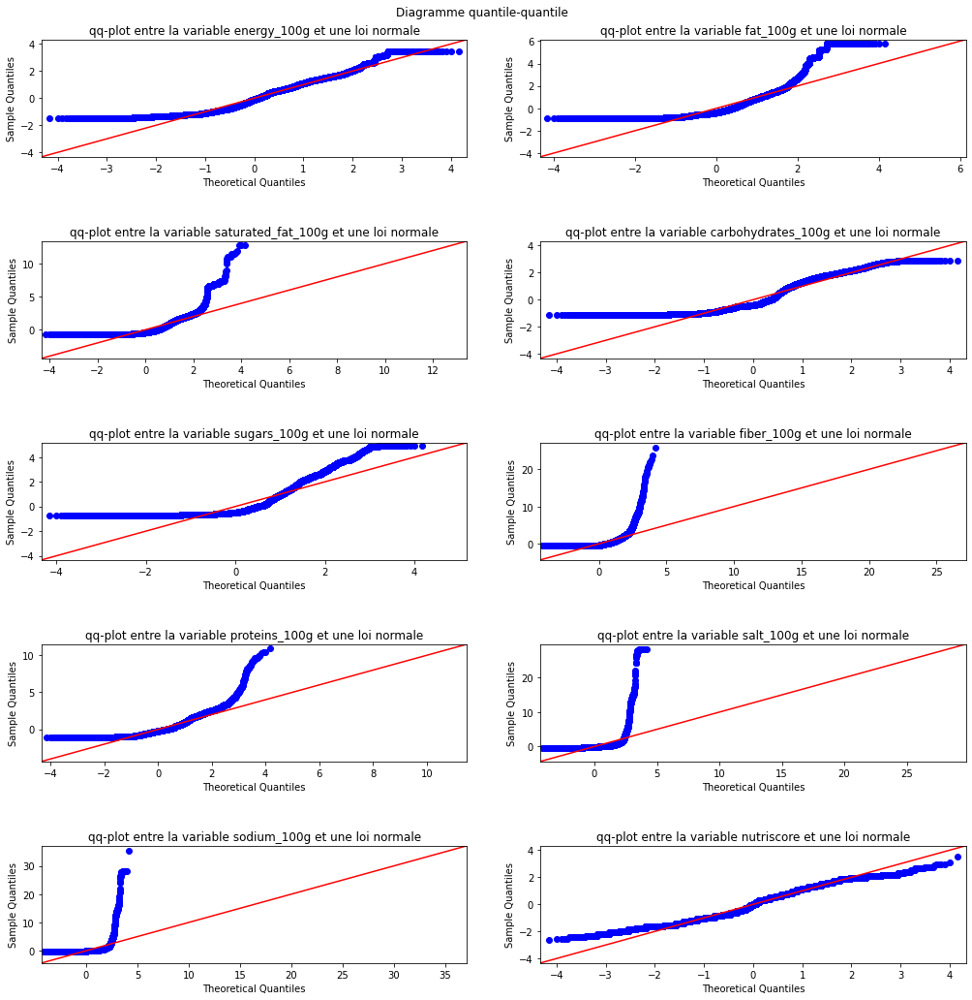

In [28]:
fc.qq_plot(data,col_num)

Plus les données se rapprochent de la droite, plus la distribution empirique est dite normale. Ici on peut constater que les seules variables se rapprochant sensiblement plus d'une distribution normale sont *nutriscore* et *energy_100g*.

####  <a id="8"></a> 1.1.f Tests de normalité

Nous allons tester la normalité des distributions. La normalité est une condition indispensable pour la réalisation des tests dits paramétriques.

Le test de normalité repose sur 2 hypothèses :
- H0 (nulle) : la distribution est normale (gaussienne).
- H1 (alternative) : La distribution n'est pas normale (non gaussienne).

Pour cela, nous allons faire appel à différents test de normalité:
- **Test de Shapiro Wilk** : basé sur la statistique W. La statistique W peut être interprétée comme le coefficient de détermination (le carré du coefficient de corrélation) entre la série des quantiles générées à partir de la loi normale et les quantiles empiriques obtenues à partir des données. Plus W est élevée, plus la compatibilité avec la loi normale est crédible.
- **Test de Kolmogorov-Smirnov** : repose sur la comparaison de la distance entre la distribution théorique et celle empirique. Si la p value des test KS est inférieur à 5%, on rejette H0 et on conclut que la distribution est non gaussienne.
- **Test d'Anderson-Darling** : variante du test Kolmogorov-Smirnov, à l'exception qu'elle donne plus d'importance aux queues de distribution. 
- **Test du K2 de D'Agostino** : basée sur les coefficients d'asymétrie et d'aplatissement. Lorsque ces deux indicateurs di􏰛ffèrent simultanément de la valeur de référence 0, on conclut que la distribution empirique n'est pas compatible avec la loi normale. 


In [29]:
fc.test_normalite(data, col_num, 0.05)

Tests de normalité pour la variable energy_100g.
                           Stat p-value Resultat
Shapiro Wilk           0.949417     0.0       H1
Anderson-Darling     880.956941     NaN       H1
K2 de D'Agostino    3170.081434     0.0       H1
Kolmogorov-Smirnov     0.992336     0.0       H1
----------------------------------------------------------------------
Tests de normalité pour la variable fat_100g.
                            Stat p-value Resultat
Shapiro Wilk            0.770601     0.0       H1
Anderson-Darling      3690.45166     NaN       H1
K2 de D'Agostino    30939.058123     0.0       H1
Kolmogorov-Smirnov      0.756724     0.0       H1
----------------------------------------------------------------------
Tests de normalité pour la variable saturated_fat_100g.
                            Stat p-value Resultat
Shapiro Wilk            0.683574     0.0       H1
Anderson-Darling     5823.324204     NaN       H1
K2 de D'Agostino    43120.970217     0.0       H1
Kolmogorov-S

/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
 

                            Stat p-value Resultat
Shapiro Wilk            0.476253     0.0       H1
Anderson-Darling     8664.416922     NaN       H1
K2 de D'Agostino    82970.537454     0.0       H1
Kolmogorov-Smirnov           0.5     0.0       H1
----------------------------------------------------------------------
Tests de normalité pour la variable proteins_100g.
                            Stat p-value Resultat
Shapiro Wilk            0.850638     0.0       H1
Anderson-Darling      2398.65113     NaN       H1
K2 de D'Agostino    23300.997983     0.0       H1
Kolmogorov-Smirnov      0.725099     0.0       H1
----------------------------------------------------------------------
Tests de normalité pour la variable salt_100g.
                             Stat p-value Resultat
Shapiro Wilk             0.202838     0.0       H1
Anderson-Darling     13214.725497     NaN       H1
K2 de D'Agostino    128493.422424     0.0       H1
Kolmogorov-Smirnov            0.5     0.0       H1
-----

/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Tout d'abord nous pouvons constater un avertissement nous précisant que la p-value peut ne pas être correcte car l'échantillon est de trop grande taille. En effet, le test de Shapiro Wilk est plus adapté aux échantillons de plus petite taille. Une des raisons pour lequelles d'autres tests ont été effectués.

Pour chaque variable, on obtient la même conclusion avec tous les tests : L'hypothèse H0 de normalité peut être rejetée avec un risque ici inférieur à 5%. Cela signifie donc qu'aucune de nos distributions n'est normale.

###  <a id="9"></a> 1.2 Données qualitatives
####  <a id="10"></a> 1.2.a Bar plots

In [30]:
col_quali = ['nutrigrade','categories','sub_categories','palm_oil']
col_quali_all = ['product_name', 'traces', 'nutrigrade','categories','sub_categories','palm_oil']

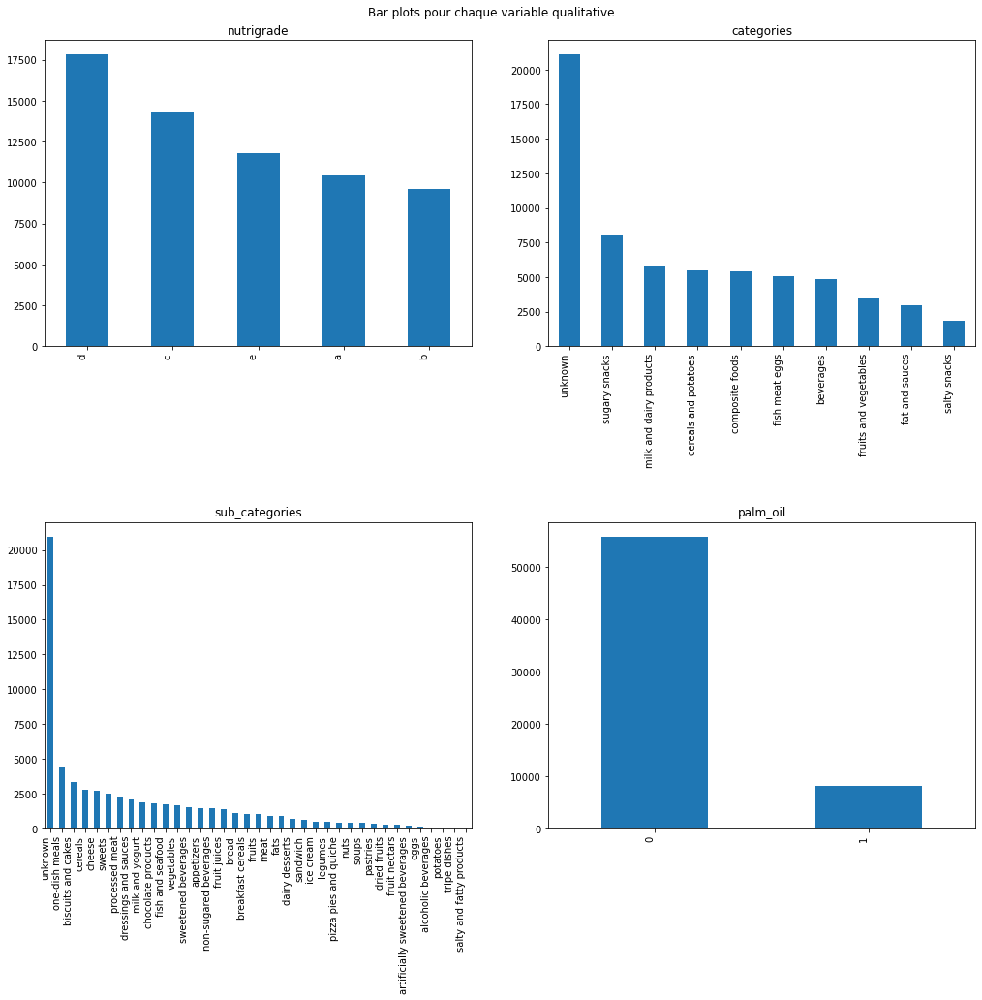

In [31]:
fc.bar_plot(data,col_quali)

Les bar plots nous permettent de constater quelles valeurs sont le plus présentes parmi les différentes variables. 
Dans l'ordre, les nutrigrades les plus présents sont d, c, e, a, b.
Pour les catégories, la valeur *unknown* est la plus renseignée. Ce n'est pas surprenant car cette variable n'est que peu complétée. Il en est de même pour les sous-catégories (*sub_categories*). Les catégories les plus présentes sont *sugary snacks* et *milk and dairy products*. Pour les sous-catégories ce sont *one-dish meals* et *biscuits and cakes* (après *unknown*).
Enfin, pour la variable *palm_oil*, la valeur 0 est la plus présente ce qui signifie que la plupart des produits ne possèdent pas d'huile de palme.

####  <a id="11"></a> 1.2.b Occurrence de mots

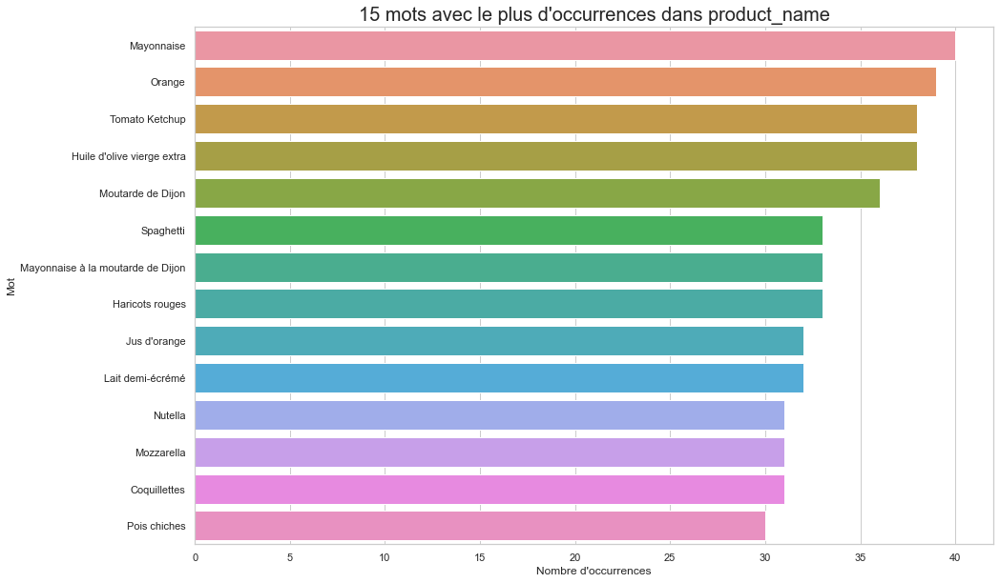

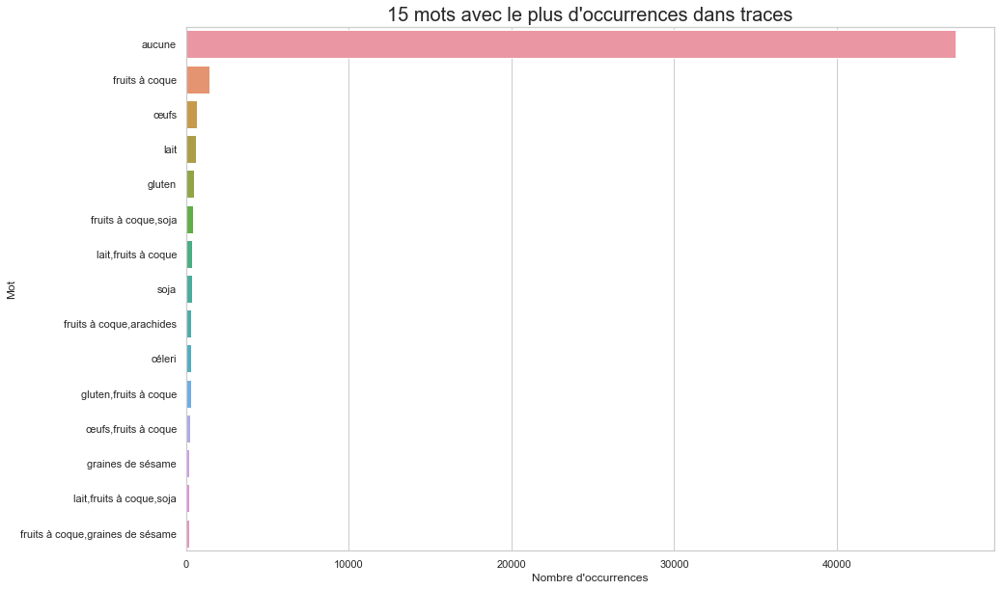

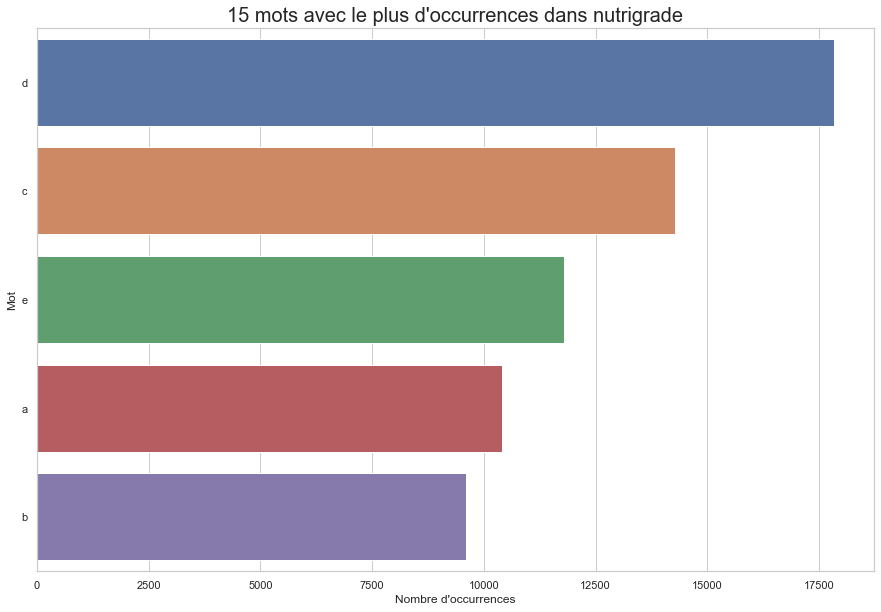

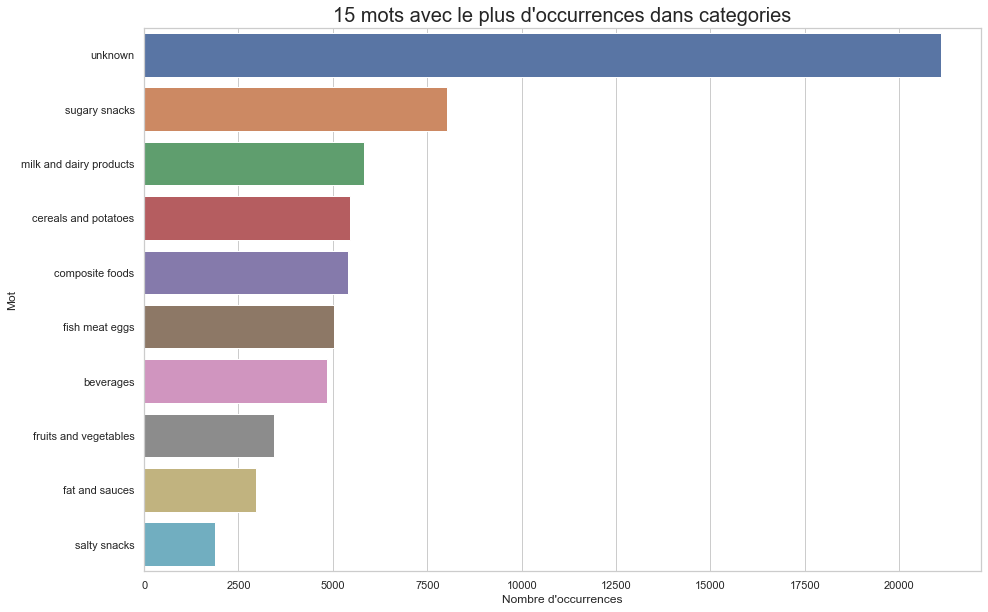

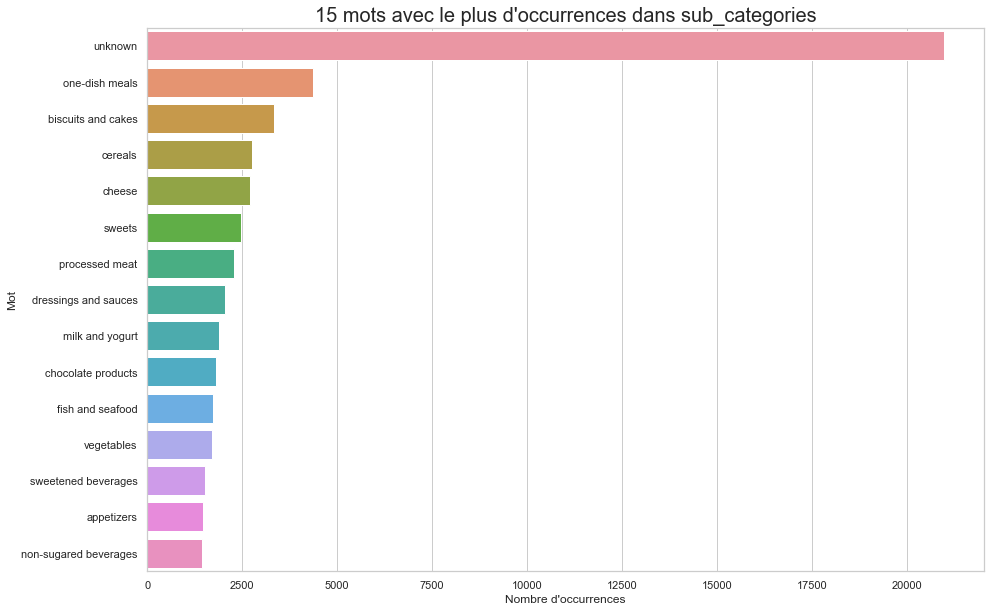

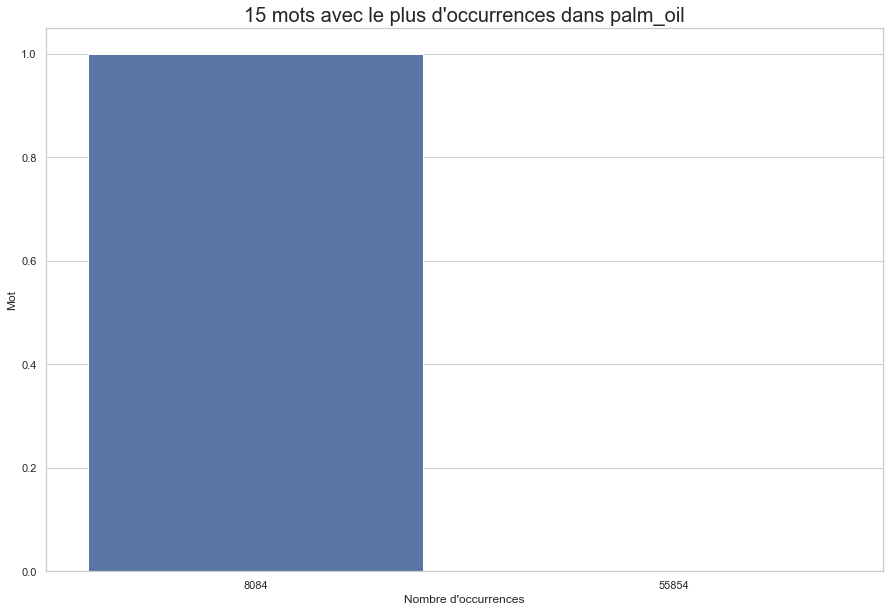

In [32]:
fc.occurrence_mot(data,col_quali_all,15)

####  <a id="12"></a> 1.2.c Pie plots

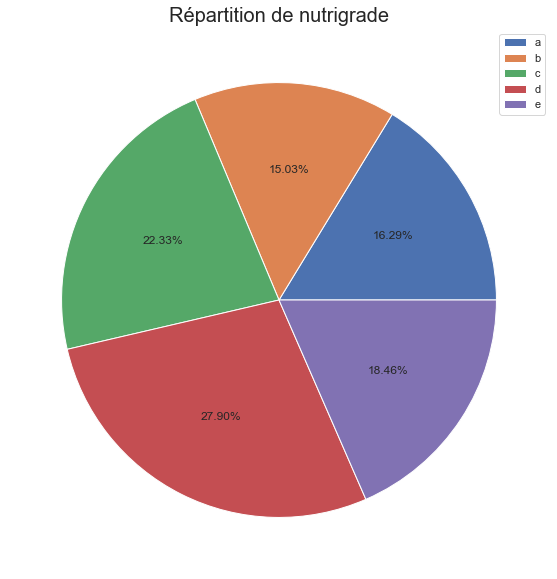

In [33]:
fc.pie_plot(data,['nutrigrade'])

On constate que les nutrigrades c et d représentent, à eux deux, 50% des nutrigrades. La proportion des 3 nutrigrades restants est du même ordre de grandeur. 

##  <a id="13"></a> 2. Analyse Bivariée

L'analyse bivariée consiste à étudier la relation entre 2 variables. Nous pouvons étudier la relation entre 2 variables quantitatives, entre 2 variables qualitatives, ou encore entre 1 variable quantitative et 1 variable qualitative.

###  <a id="14"></a> 2.1 Relation entre 2 variables quantitatives : les valeurs nutritionnelles et le nutriscore

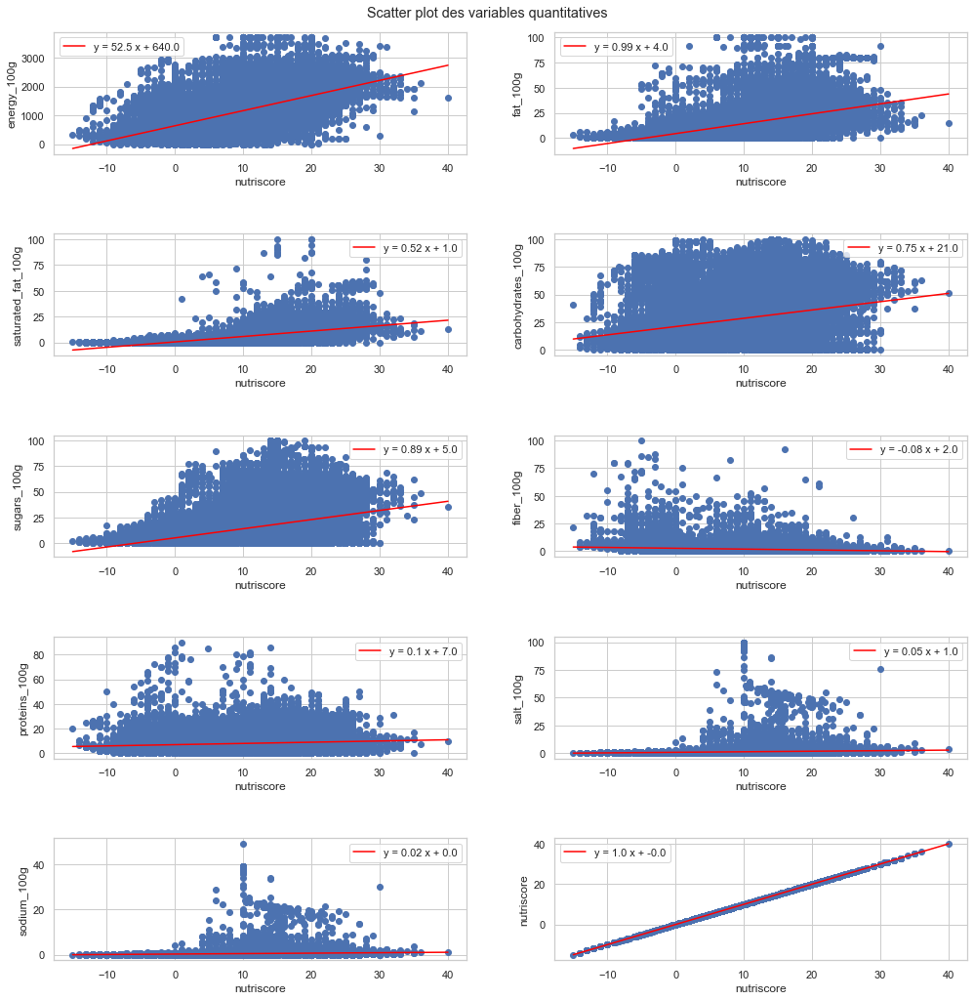

In [34]:
fc.scatter_plot(data,col_num, var_comparaison = 'nutriscore' ,largeur = 2,longueur=5)

Nous avons les différents scatter plot entre chaque valeur nutritionnelle et le nutriscore. À titre de comparaison, nous avons le scatter plot du nutriscore avec lui même qui représente bien entendu la forme d'une corrélation. 

On peut se poser la question d'une corrélation positive entre la variable *saturated-fat_100g* et le nutriscore. Cela signifie que plus la quantité de *saturated-fat_100g* augmente, plus le nutriscore augmente (devient moins "bon"). Ce qui est relativement cohérent lorsque l'on sait que le gras saturé n'est pas bon pour la santé et est à limiter. 
À l'inverse, une corrélation négative semble se dessiner avec la variable *fiber_100g* et le nutriscore. Cela signifie que plus la quantité de *fiber_100g* augmente, plus le nutriscore diminue (devient meilleur). Ce qui est relativement cohérent quand on sait que les fibres se trouvent principalement dans les légumes, les fruits et les légumineuses.

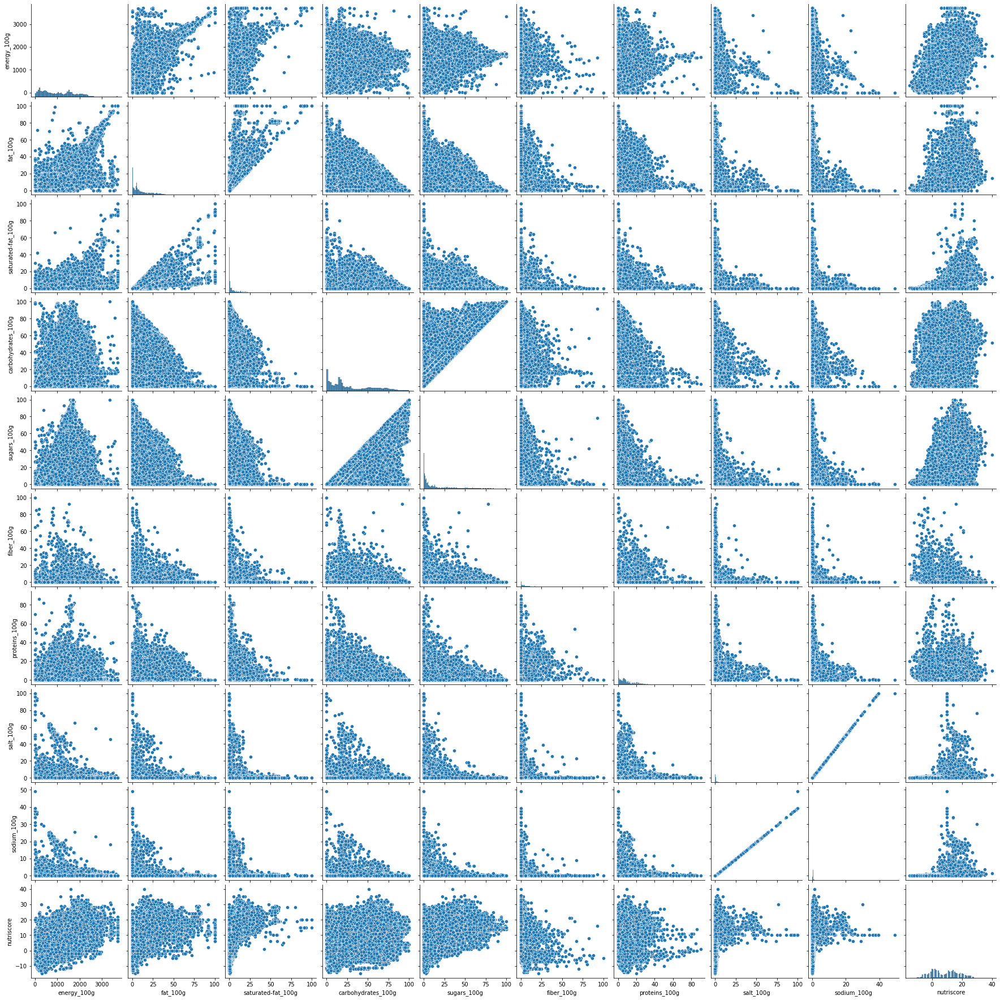

In [150]:
fc.pair_plot(data,'pairplot_quantitatif')

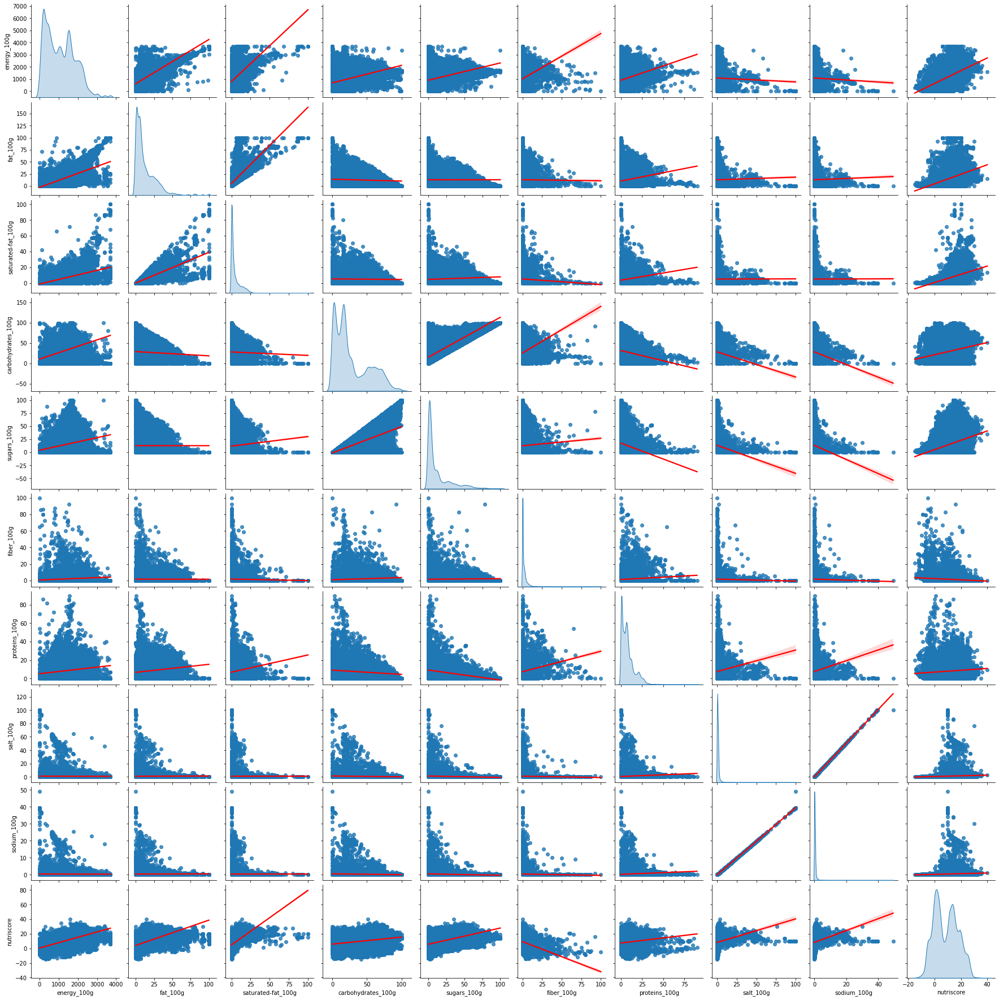

In [75]:
fc.pair_plot_reg(data,col_num,'pairplot_quantitatif_reg')

La première constatation évidente est la corrélation quasi linéaire entre les variables *salt_100g* et *sodium_100g*. En effet, cela est cohérent puisque le sodium est une composante du sel. 

Ensuite, on constate que certaines variables semblent corrélées entre elles. 
Il y a une correlation positive entre *carbohydrates_100g* et *sugars_100g*. Cela signifie que plus la quantité de *carbohydrates_100g* augmente, plus la quantité de *sugars_100g* augmente. De plus, on constate que la quantité de sucre ne dépasse jamais celle des glucides (carbohydrates), ce qui est cohérent puisque les sucres font partie des glucides.
De même, on constate une corrélation positive entre les variables *fat_100g* et *saturated-fat_100g*.

On peut se demander si il n'existerait pas également des corrélations négatives entre les glucides et les matières grasses, entre les glucides et le sel, et entre les glucides et les protéines.


Ces observations sont également (en partie) dû aux choix de nettoyage et d'imputation fait sur les données.

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutriscore
energy_100g,1.000000,0.724212,0.584876,0.475262,0.335890,0.188045,0.237109,-0.015174,-0.015238,0.620203
fat_100g,0.724212,1.000000,0.784591,-0.062850,-0.000661,-0.005606,0.172843,0.012543,0.012435,0.584399
saturated_fat_100g,0.584876,0.784591,1.000000,-0.025395,0.076143,-0.036514,0.184530,0.001295,0.001286,0.625854
carbohydrates_100g,0.475262,-0.062850,-0.025395,1.000000,0.701410,0.174573,-0.152429,-0.086831,-0.086603,0.266629
sugars_100g,0.335890,-0.000661,0.076143,0.701410,1.000000,0.030657,-0.256417,-0.105138,-0.104777,0.445472
fiber_100g,0.188045,-0.005606,-0.036514,0.174573,0.030657,1.000000,0.111731,-0.022216,-0.022216,-0.176301
proteins_100g,0.237109,0.172843,0.184530,-0.152429,-0.256417,0.111731,1.000000,0.108124,0.107660,0.116946
salt_100g,-0.015174,0.012543,0.001295,-0.086831,-0.105138,-0.022216,0.108124,1.000000,0.999606,0.126983
sodium_100g,-0.015238,0.012435,0.001286,-0.086603,-0.104777,-0.022216,0.107660,0.999606,1.000000,0.126636
nutriscore,0.620203,0.584399,0.625854,0.266629,0.445472,-0.176301,0.116946,0.126983,0.126636,1.000000


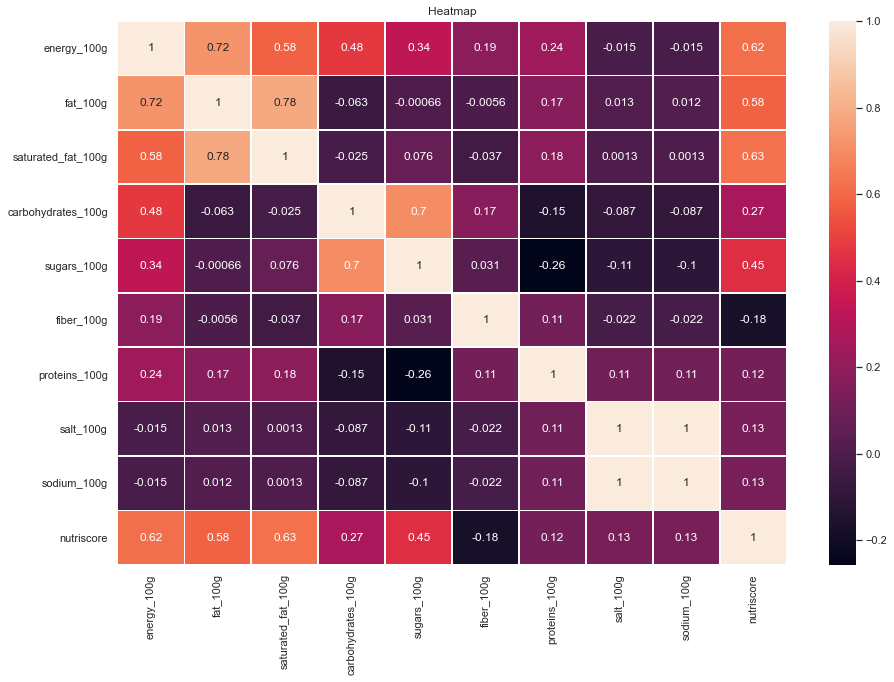

In [36]:
# Calcule la matrice de corrélation calculée avec la méthode de Pearson ainsi que la heatmap
df1 = data[col_num].copy()
df_corr = df1.corr()
display(df_corr)

fc.heat_map(df_corr)

On constate ici différentes corrélations entre les variables. 
En effet, la corrélation entre le sel et le sodium est bien présente et même parfaite puisqu'elle est de 1.  
Les variables *carbohydrates_100g* et *sugars_100g* sont bien fortement corrélées positivement (0.7). De même pour les variables *fat_100g* et *saturated-fat_100g* (0.78).

Dans une moindre mesure, les variables *proteins_100g* et *sugars_100g* sont corrélées négativement (-0.26) et les variables *proteins_100g* et *fat_100g* sont corrélées positivement (0.17).

En ce qui concerne la variable *energy_100g* les variables avec lesquelles elle est le plus corrélée positivement sont *fat_100g* (0.72), *nutriscore* (0.62), *saturated-fat_100g* (0.58) et *carbohydrates_100g* (0.48).

Les variables ayant les plus forte corrélations positives avec le *nutriscore* sont *saturated-fat_100g* (0.63), *fat_100g* (0.58) et *sugars_100g* (0.45).

Nous allons désormais réaliser d'autres tests de corrélation entre les variables nutritionnelles et le nutriscore afin de confirmer ou infirmer nos hypothèses.

In [37]:
fc.tests_corr(data,col_num,'nutriscore')

Tests de corrélation pour la variable energy_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.620203,0.0
Spearman,0.615408,0.0
Kendall,0.445629,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable fat_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.584399,0.0
Spearman,0.639159,0.0
Kendall,0.461401,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable saturated_fat_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.625854,0.0
Spearman,0.658324,0.0
Kendall,0.487793,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable carbohydrates_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.266629,0.0
Spearman,0.221806,0.0
Kendall,0.153812,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable sugars_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.445472,0.0
Spearman,0.337424,0.0
Kendall,0.237489,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable fiber_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,-0.176301,0.0
Spearman,-0.286208,0.0
Kendall,-0.217776,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable proteins_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.116946,0.0
Spearman,0.120973,0.0
Kendall,0.077389,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable salt_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.126983,0.0
Spearman,0.304321,0.0
Kendall,0.212533,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable sodium_100g par rapport à la variable nutriscore.


,Stat,p-value
Pearson,0.126636,0.0
Spearman,0.305208,0.0
Kendall,0.214677,0.0


----------------------------------------------------------------------------------------------------
Tests de corrélation pour la variable nutriscore par rapport à la variable nutriscore.


,Stat,p-value
Pearson,1.0,0.0
Spearman,1.0,0.0
Kendall,1.0,0.0


----------------------------------------------------------------------------------------------------


Nos variables possèdent toutes une corrélation plus ou moins importante avec le nutriscore. Les p-values sont toutes inférieures à 5%.
Il faut tout de même noter que l'échantillon est très important et peut rendre les p-value inférieure à celle que nous aurions eu avec un plus petit échantillon. En effet, les tests statistiques sont très sensibles à la taille de l'échantillon.


###  <a id="15"></a> 2.2 Relation entre 1 variable quantitative et 1 variable qualitative

###  <a id="16"></a> 2.2.a Le nutrigrade et les valeurs nutritionnelles

Nous allons étudier les relations entre le nutrigrade et les valeurs nutritionnelles.

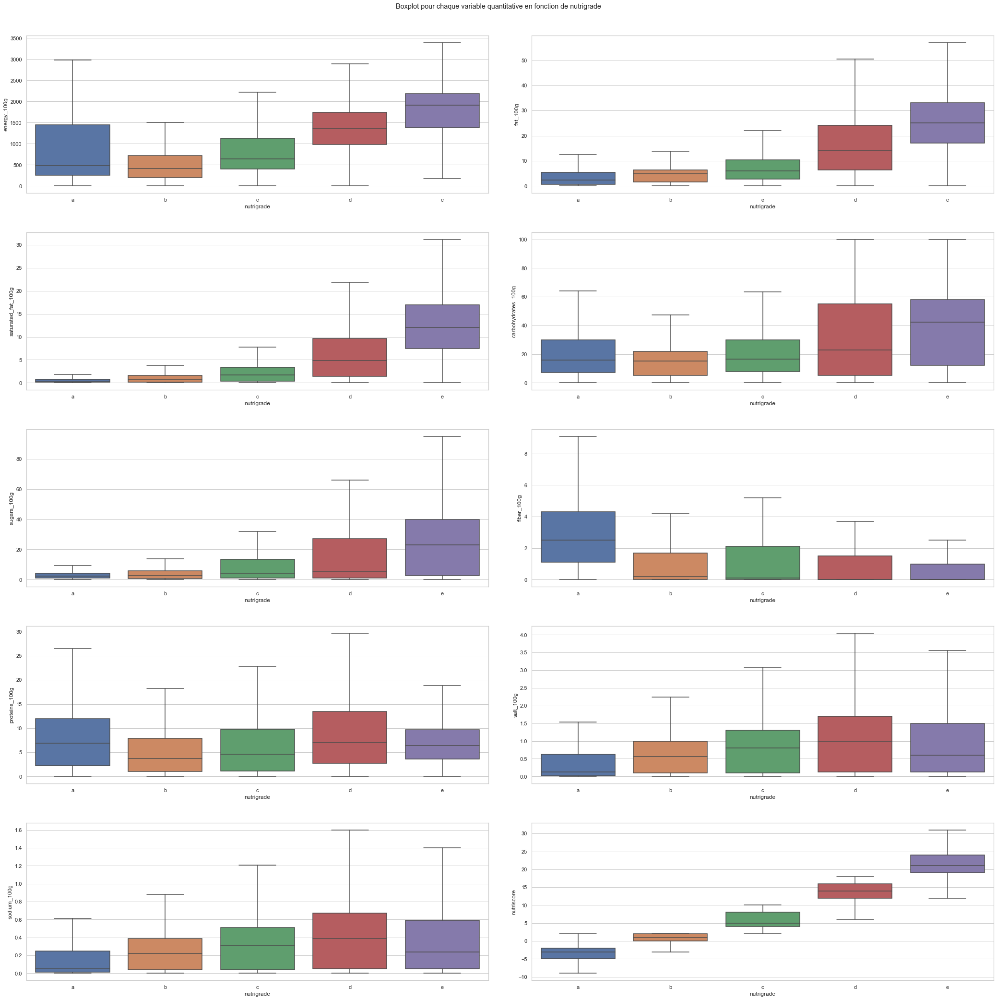

In [38]:
fc.boxplot_relation(data,col_num,'nutrigrade',5,2,nom='boxplot_nutrigrade',ordre=['a','b','c','d','e'],outliers=False)

Pour des raisons de visualisation, les points jugés comme outliers par le boxplot n'ont pas été représentés.

Le nutrigrade est déterminé en fonction du nutriscore, ce qui explique la forme du graphe. On constate que certains points se chevauchent, ce qui traduit des erreurs dans la détermination du nutrigrade. Cependant les 1er et 3ème quantiles ne se chevauchent pas, la plupart des valeurs semblent donc correctes.

Pour certaines variables, la distribution varie en fonction du nutrigrade.
Les variables de matières grasses ont tendance à être élevées quand le nutrigrade augmente. Il en est de même pour les glucides et surtout le sucre.
Les fibres présentent une évolution inverse. En effet, elles semblent présentes en plus grande quantité lorsque le nutrigrade est faible.

Les autres variables varient dans une moindre mesure.

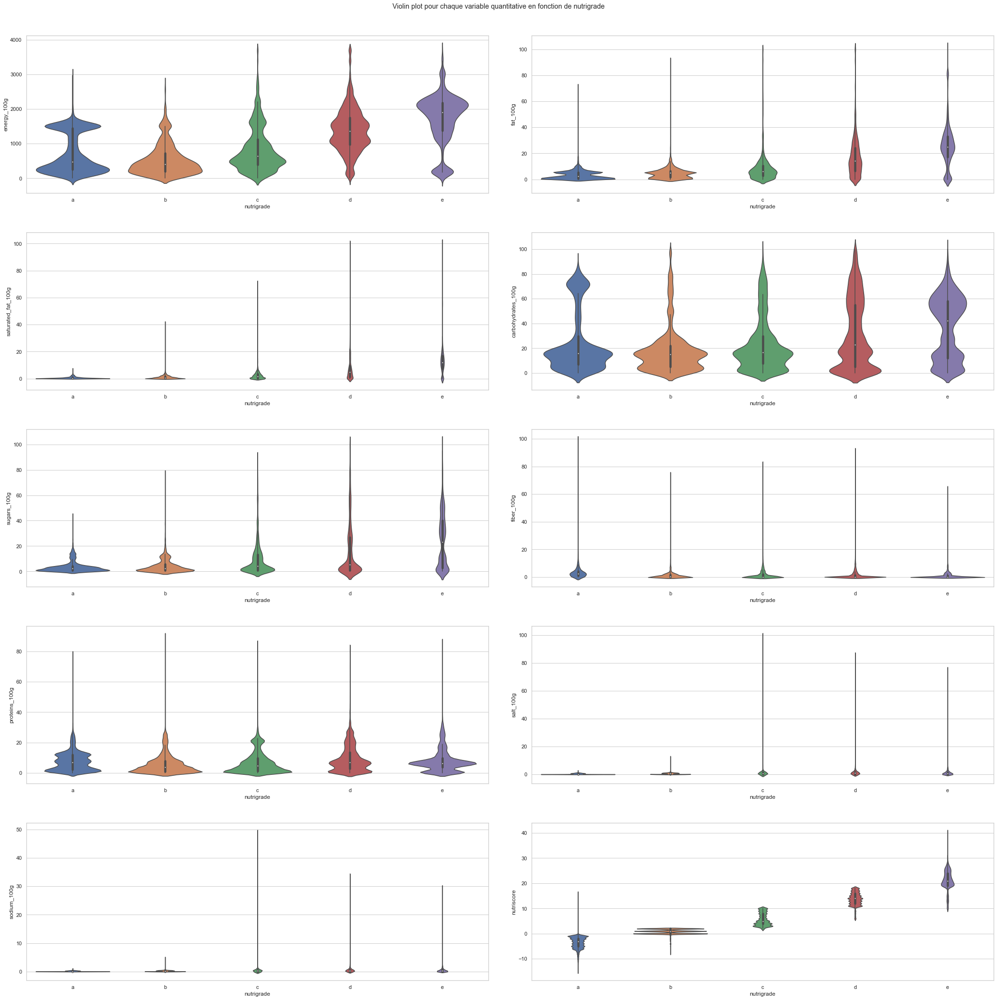

In [39]:
fc.violinplot_relation(data,col_num,'nutrigrade',5,2,['a','b','c','d','e'],False)

Le violin plot nous permet de constater que les variables *satured-fat_100g* et *salt_100g* ne possède un bon nutrigrade que lorsqu'ils sont très faibles (voir absents) tandis que leur nutrigrade augmente lorsque leur valeur augmente. La variable *sugars_100g* semble présenter la même tendance. Cela confirme nos premières observations faites avec les boxplot.

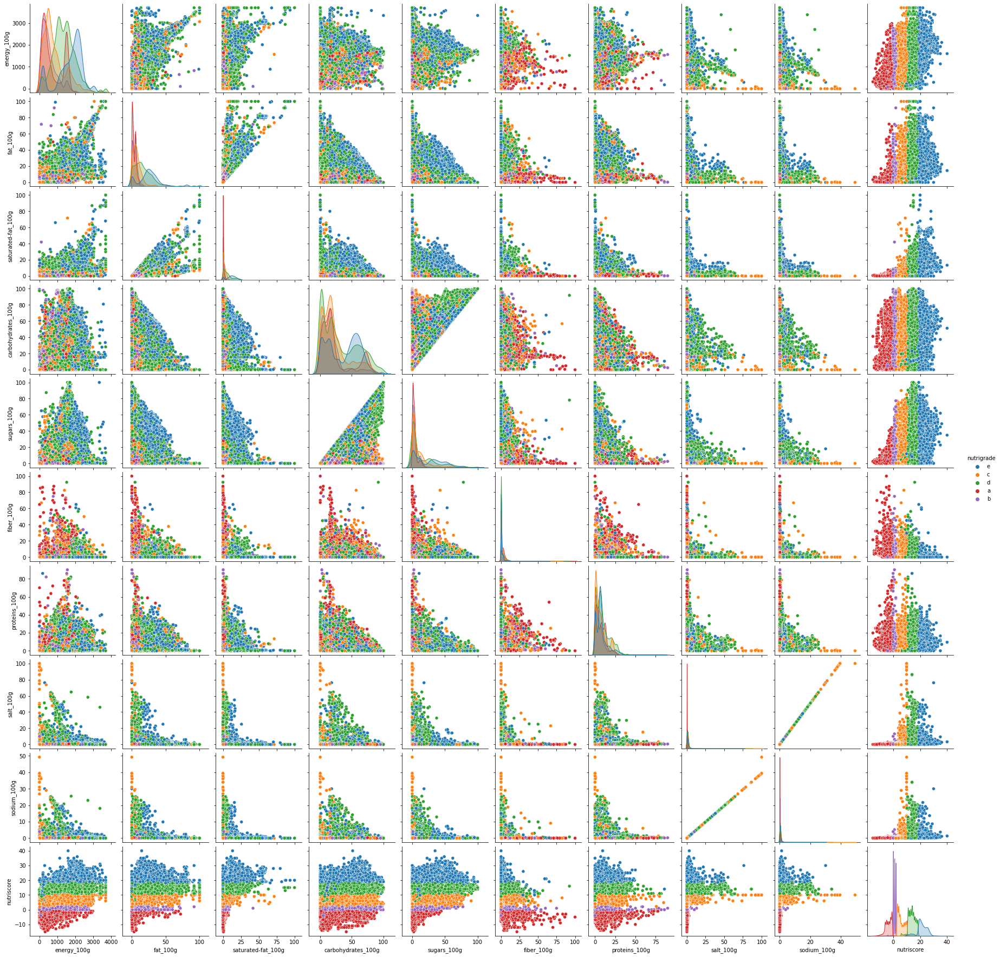

In [155]:
fc.pair_plot(df=data,nom ='pairplot_qualitatif',var_quali='nutrigrade')

La concentration des points ne permet pas de faire ressortir une tendance claire.

Comme le démontre les tests précédemment réalisés, nos données ne sont pas normalement distribuées. Nous ne pouvons donc pas utiliser l'ANOVA qui nécessite cette condition au préalable.
L'ANOVA nous permet de déterminer si les moyennes des groupes sont significativement différentes.
Nous utiliserons plutôt le test de Kruskall-Wallis. C'est une alternative non-paramétrique à l'ANOVA. Ainsi, l'interprétation du test de Kruskal-Wallis est très similaire à une ANOVA paramétrique d'ordre 1, sauf qu'il est basé sur les rangs au lieu des moyennes. 

L'hypothèse nulle est que les différents échantillons à comparer sont issus de la même distribution (ou de distributions de même médiane). 

In [40]:
fc.Kruskall_Wallis_test(data,col_num, 'nutrigrade', 0.05, 'Kruskall-Wallis')

Test de Kruskall-Wallis pour la variable energy_100g par rapport à la variable nutrigrade.
stat=20467.600, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour la variable fat_100g par rapport à la variable nutrigrade.
stat=20405.892, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour la variable saturated_fat_100g par rapport à la variable nutrigrade.
stat=21815.973, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour la variable carbohydrates_100g par rapport à la variable nutrigrade.
stat=2733.902, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour l

On observe pour toutes les variables un rejet de H0, c'est-à-dire que les différents échantillons à comparer ne sont pas issus de la même distribution (ou de distributions de même médiane).

###  <a id="17"></a> 2.2.b Les catégories et les valeurs nutritionnelles

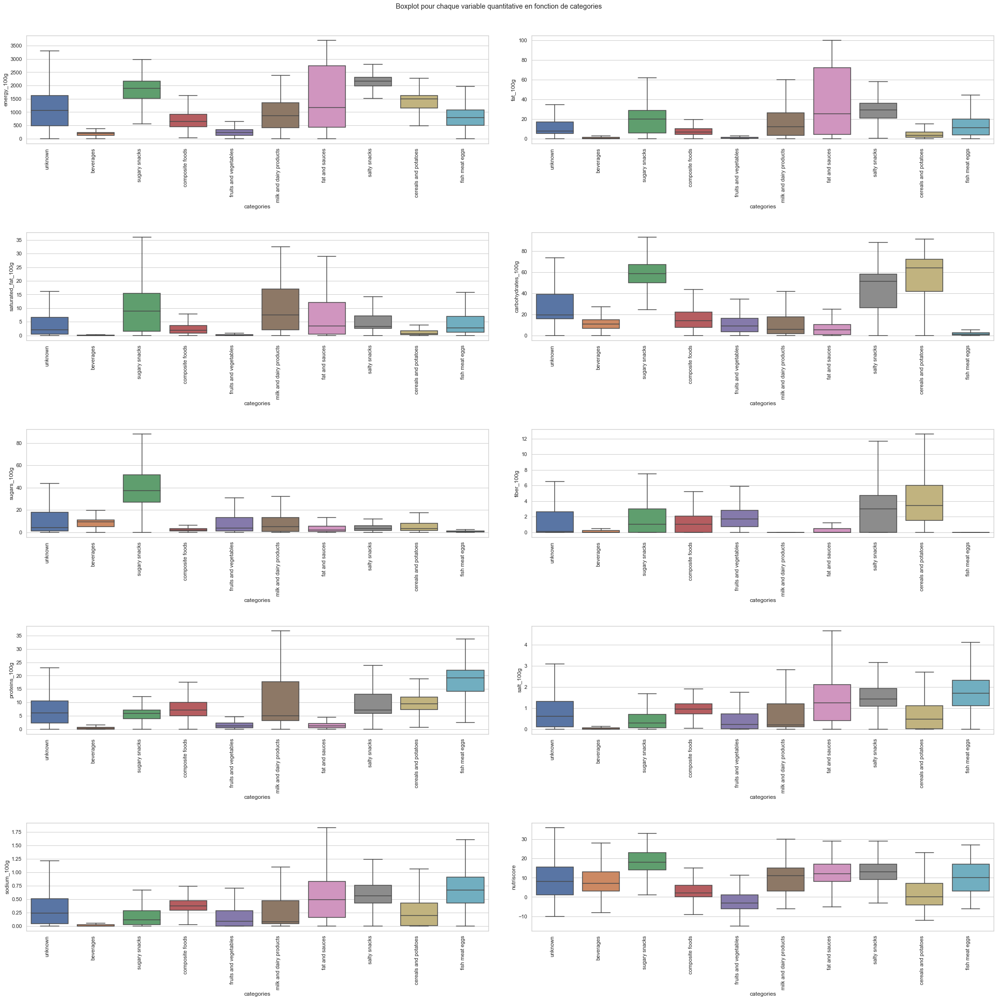

In [41]:
fc.boxplot_relation(data,col_num,'categories',5,2,nom='boxplot_categories',outliers=False,option=True)

On constate bien des variations en fonction des différentes catégories de produits. 
La variables *energy_100g* semble plus importante dans les catégories *salty snacks*, *fat and sauces* et *milk and dairy products*. Elle est en revanche plus faible pour les catégories *beverages* et *fruits dans vegetables*.

Pour les variables associées aux matières grasses ce sont sans grande surprise les produits *salty snacks*, *fat and sauces* et *sugary snacks* qui présentent des valeurs plus importantes (en particulier en gras saturé).
Les glucides sont plus présents dans les *salty snacks*, *sugary snacks* et *cereals and potatoes*. 
Le sel est très présent dans *salty snacks*, *fat and sauces* et *fish meat eggs*.

Enfin, grâce au boxplot du nutriscore en fonction des categories, on constate que les catégories ayant le nutriscore le plus élevé sont *sugary snacks*, *milk and dairy products*, *fat and sauces* et *salty snacks*; tandis que *composite foods* et *fruits dans vegetables* ont un nutriscore relativement faible.


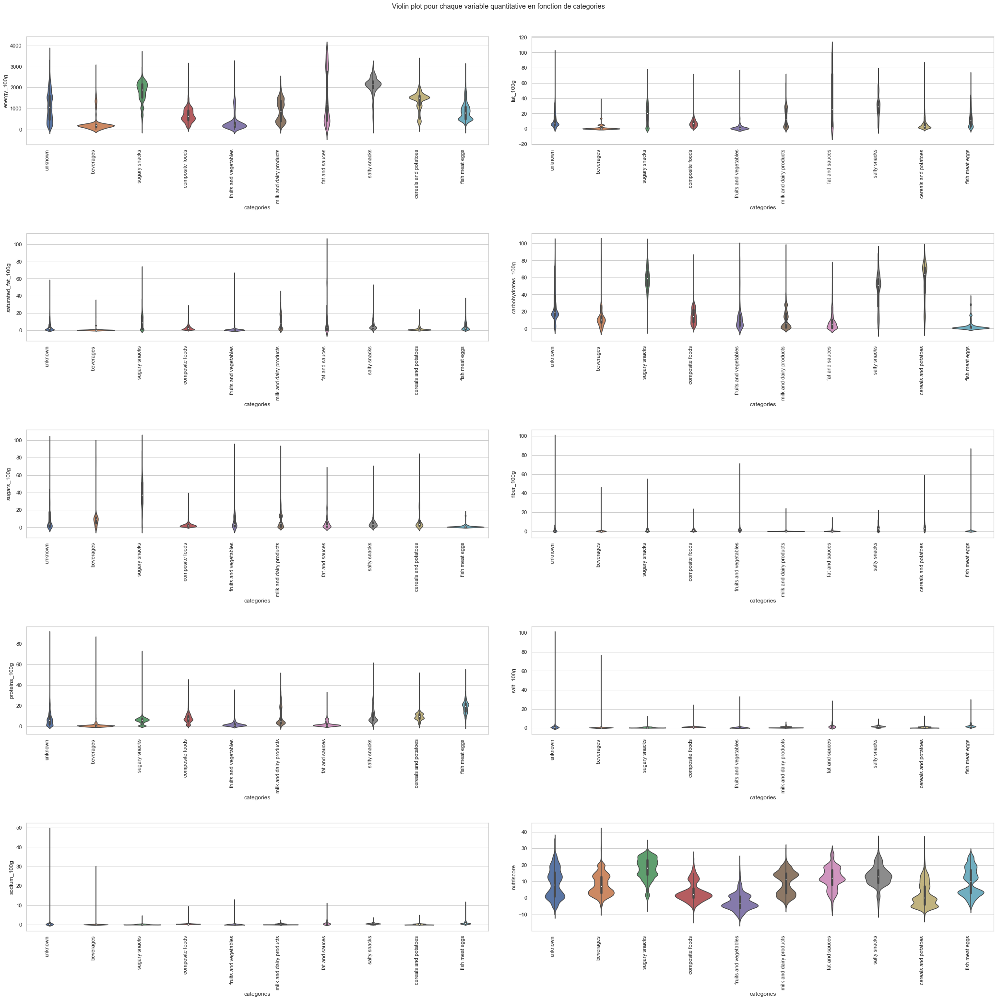

In [42]:
fc.violinplot_relation(data,col_num,'categories',5,2,option=True)

Les violin plot nous permettent de confirmer les constatations faites à l'aide des boxplot. 

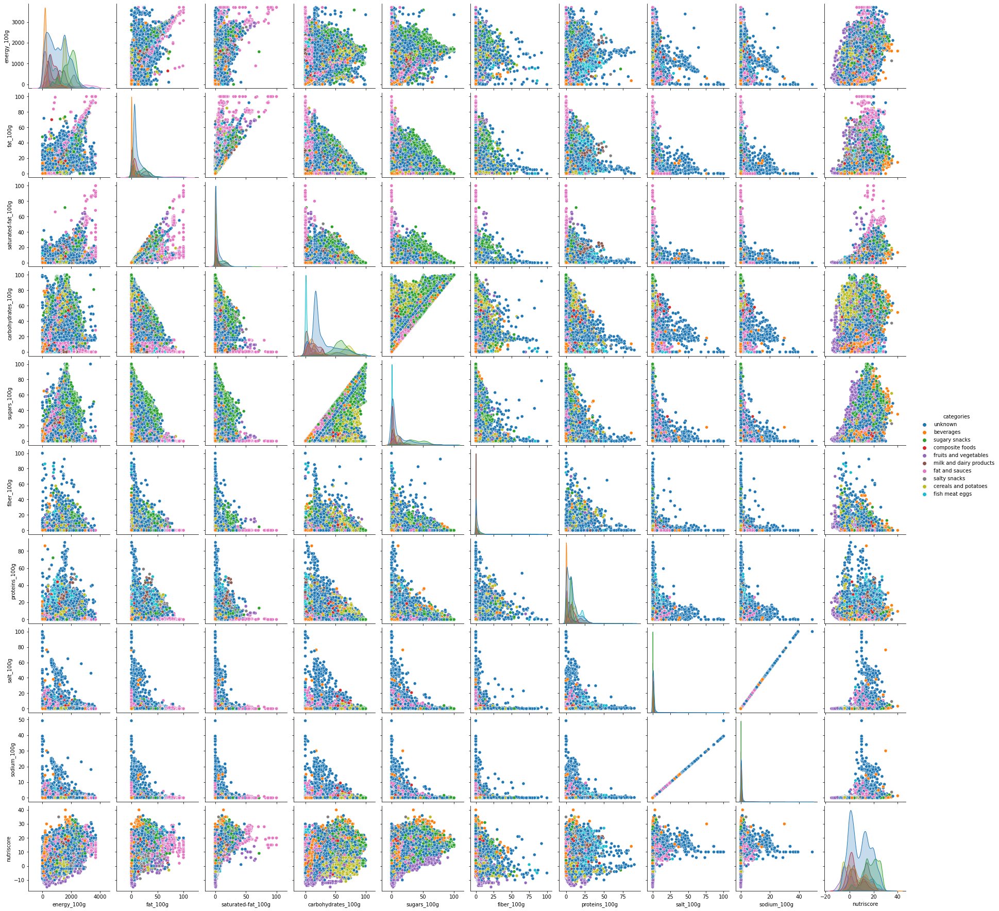

In [257]:
fc.pair_plot(df=data,nom ='pairplot_categories',var_quali='categories')

Encore une fois, la concentration des points ne permet pas de faire ressortir une tendance claire.

In [44]:
fc.Kruskall_Wallis_test(data,col_num, 'categories', 0.05, 'Kruskall-Wallis')

Test de Kruskall-Wallis pour la variable energy_100g par rapport à la variable categories.
stat=25042.597, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour la variable fat_100g par rapport à la variable categories.
stat=19138.910, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour la variable saturated_fat_100g par rapport à la variable categories.
stat=18101.709, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour la variable carbohydrates_100g par rapport à la variable categories.
stat=33312.096, p-value=0.00000
H1: rejet de H0
----------------------------------------------------------------------------------------------------
Test de Kruskall-Wallis pour 

Encore une fois, on observe pour toutes les variables un rejet de H0, c'est-à-dire que les différents échantillons à comparer ne sont pas issus de la même distribution (ou de distributions de même médiane).

###  <a id="18"></a> 2.3 Relation entre 2 variables qualitatives

###  <a id="19"></a> 2.3.a Le nutrigrade et les catégories

In [45]:
tab_cont = fc.contingence_tab(data,'nutrigrade','categories')
tab_cont

categories,beverages,cereals and potatoes,composite foods,fat and sauces,fish meat eggs,fruits and vegetables,milk and dairy products,salty snacks,sugary snacks,unknown
nutrigrade,,,,,,,,,,
a,155,2606,1217,77,446,2291,394,42,51,3134
b,607,849,1668,202,671,654,981,63,267,3645
c,1479,1123,1530,789,1447,417,1467,493,711,4822
d,841,795,900,1301,1500,67,2452,938,3035,6010
e,1757,80,81,587,978,9,518,336,3953,3502


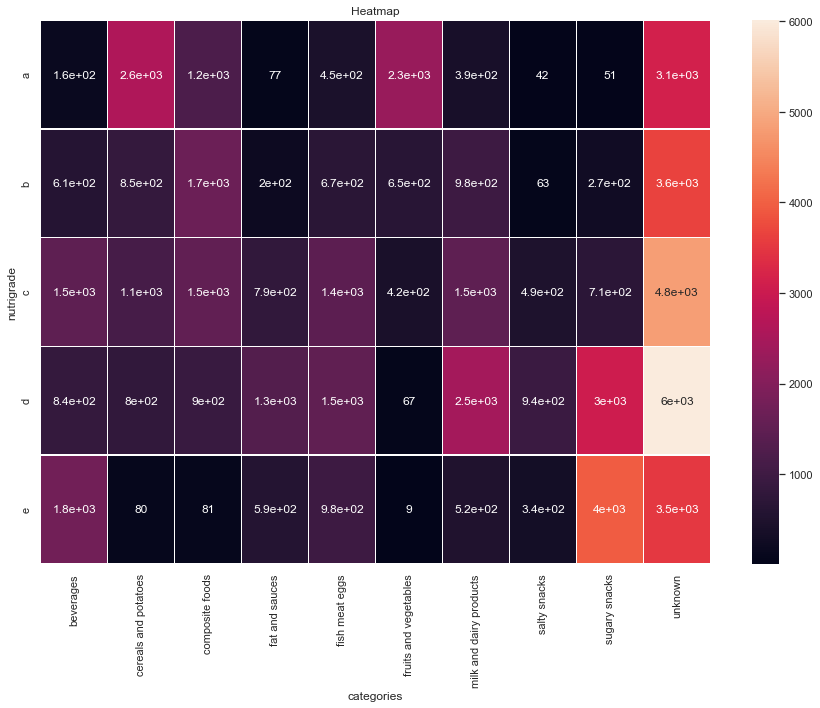

In [46]:
fc.heat_map(tab_cont)

La table de contingence et la heatmap nous informent des liens existants entre 2 variables qualitatives. Ici, nous pouvons constater que:
- le nutriscore A a plus tendance à provenir de produits de catégorie *cereals and potatoes* et *fruits and vegetables*.
- le nutriscore B a plus tendance à provenir de produits de catégorie *composite food* et *milk and dairy products*.
- le nutriscore C a plus tendance à provenir de produits de catégorie *beverages*, *composite food* et *milk and dairy products*.
- le nutriscore D a plus tendance à provenir de produits de catégorie *sugary snacks* et *milk and dairy products*.
- le nutriscore E a plus tendance à provenir de produits de catégorie *ugary snacks* et *beverages*.

Le test du Chi2, dans la même logique que celle appliquée au calcul du coefficient de corrélation linéaire pour des variables quantitatives, permet de savoir si il existe une liaison entre deux variables, et si oui quelle est son intensité.

H0: les variables sont indépendantes.

In [47]:
fc.test_chi2(data, 'categories', 'nutrigrade')

Test d'indépendance Chi-2 entre categories et nutrigrade
stat = 25452.095359383562
p-value = 0.0
degrees of freedom = 36
Variables non indépendantes (H0 rejetée) car p = 0.0 <= alpha = 0.05
----------------------------------------------------------------------


Le test de Chi-2 nous infome donc que les deux variables sont dépendantes.

###  <a id="20"></a> 2.3.a Les traces et les catégories

In [48]:
tab_cont_traces = fc.contingence_tab(data,'traces','categories')
tab_cont_traces

categories,beverages,cereals and potatoes,composite foods,fat and sauces,fish meat eggs,fruits and vegetables,milk and dairy products,salty snacks,sugary snacks,unknown
traces,,,,,,,,,,
amandes et cereales contenant du gluten,0,0,0,0,0,0,0,0,1,0
anhydride sulfureux et sulfites,6,2,9,16,17,21,0,1,1,20
"anhydride sulfureux et sulfites,caseine de lait",0,0,0,1,0,0,0,0,0,0
"anhydride sulfureux et sulfites,noyau",0,0,0,0,0,0,0,0,0,1
"anhydride sulfureux et sulfites,phenylalanine",1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
"œufs,soja,arete",0,0,1,0,0,0,0,0,0,0
"œufs,soja,autres fruits a coque",0,0,0,0,0,0,0,0,4,0
"œufs,soja,autres fruits a coque,cereales contenant du gluten",0,0,0,0,0,0,0,0,1,0


In [49]:
fc.test_chi2(data, 'categories', 'traces')

Test d'indépendance Chi-2 entre categories et traces
stat = 82726.17783988977
p-value = 0.0
degrees of freedom = 18135
Variables non indépendantes (H0 rejetée) car p = 0.0 <= alpha = 0.05
----------------------------------------------------------------------


Le test de Chi-2 nous informe encore une fois que les deux variables sont dépendantes.

##  <a id="21"></a> 3. Analyse Multivariée

L’analyse multivariée regroupe les méthodes statistiques qui s’attachent à l’observation et au traitement simultané de plusieurs variables qui sont donc prises en compte au même niveau.





###  <a id="22"></a> 3.1 ACP (Analyse en Composantes Principales)

Nous allons réaliser notre ACP sur nos variables quantitatives.

Nous commençons l'étude avec 10 composantes car nous avons 10 variables. Nous déterminerons le nombre de composantes à analyser par la suite.

In [50]:
X = data.loc[:, col_num].values
n_comp = 10

std_scale = StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

pca = PCA(n_components=n_comp)
pca.fit(X_scaled)

PCA(n_components=10)

In [51]:
pca.explained_variance_ratio_

array([3.19215883e-01, 2.18695783e-01, 1.73279419e-01, 1.20470294e-01,
       7.64701781e-02, 4.03897245e-02, 2.41973536e-02, 1.95940403e-02,
       7.64798396e-03, 3.93410301e-05])

In [52]:
pca.explained_variance_ratio_.cumsum()

array([0.31921588, 0.53791167, 0.71119108, 0.83166138, 0.90813156,
       0.94852128, 0.97271863, 0.99231268, 0.99996066, 1.        ])

Ici la 1ère composante capte environ 32% de la variance de nos données initiales, la 2ème 22% etc.

Nous allons réaliser l'éboulis des valeurs propres ainsi que le scree plot afin de déterminer combien de composantes étudier.

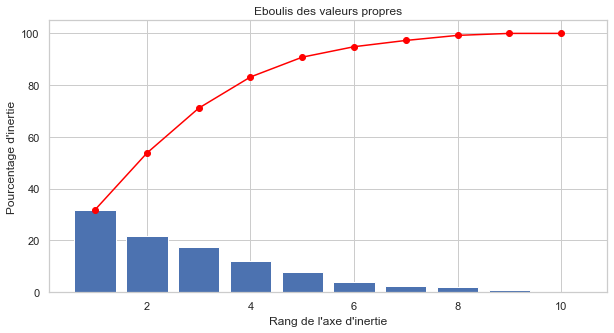

In [53]:
fc.eboulis(pca)

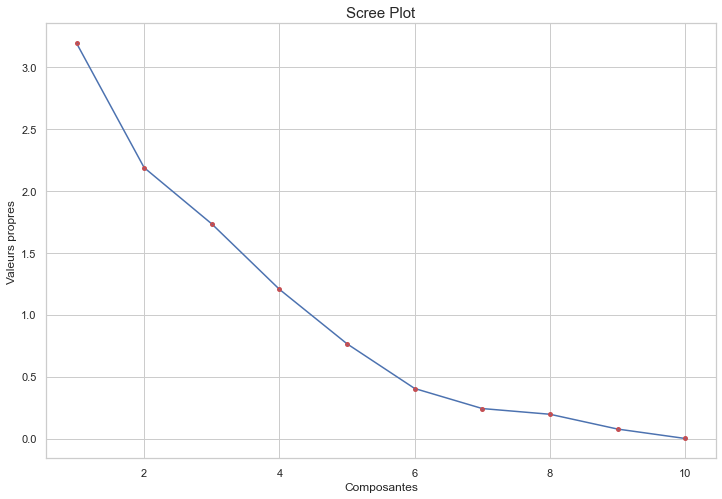

In [54]:
fc.scree_plot(pca)

Pour le graphe d'éboulis de valeurs propres, on a en bleu la variance de chaque nouvelle composante, et en rouge la variance cumulée. 

Sur le scree plot, on constate que le "coude" se trouve au niveau de la 6ème composante.

Nous allons donc porter notre analyse sur les 6 premières composantes car elles représentent presque 95% de la variance.

In [55]:
pcs = pd.DataFrame(pca.components_)
pcs.columns = col_num
pcs.index = [f"F{i}" for i in range(1,n_comp+1)]
pcs.round(2)

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutriscore
F1,0.50,0.45,0.45,0.22,0.24,0.02,0.11,0.02,0.02,0.47
F2,-0.05,0.14,0.12,-0.36,-0.36,-0.08,0.25,0.57,0.56,0.05
F3,0.01,-0.29,-0.27,0.48,0.45,0.07,-0.24,0.41,0.41,0.09
F4,0.22,-0.04,-0.11,0.16,-0.11,0.80,0.45,0.01,0.01,-0.25
F5,-0.01,0.28,0.20,-0.17,-0.11,0.45,-0.78,0.07,0.07,-0.16
F6,-0.47,-0.23,0.26,-0.40,0.43,0.35,0.12,-0.03,-0.03,0.41
F7,-0.21,-0.24,0.76,0.35,-0.02,-0.10,0.07,0.04,0.04,-0.42
F8,-0.06,-0.37,0.07,0.30,-0.63,0.12,-0.15,-0.05,-0.05,0.57
F9,-0.65,0.60,-0.15,0.41,-0.06,0.05,0.12,-0.00,-0.00,0.06
F10,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.71,0.71,0.00


Ce tableau nous indique comment sont calculées chacunes des composantes F1 à F10. 
Par exemple, pour F1 nous avons:

F1 = (0.5 * energy_100g) + (0.45 * fat_100g) + (0.45 * saturated-fat_100g) +...+ (0.02 * sodium_100g) + (0.47 * nutriscore)

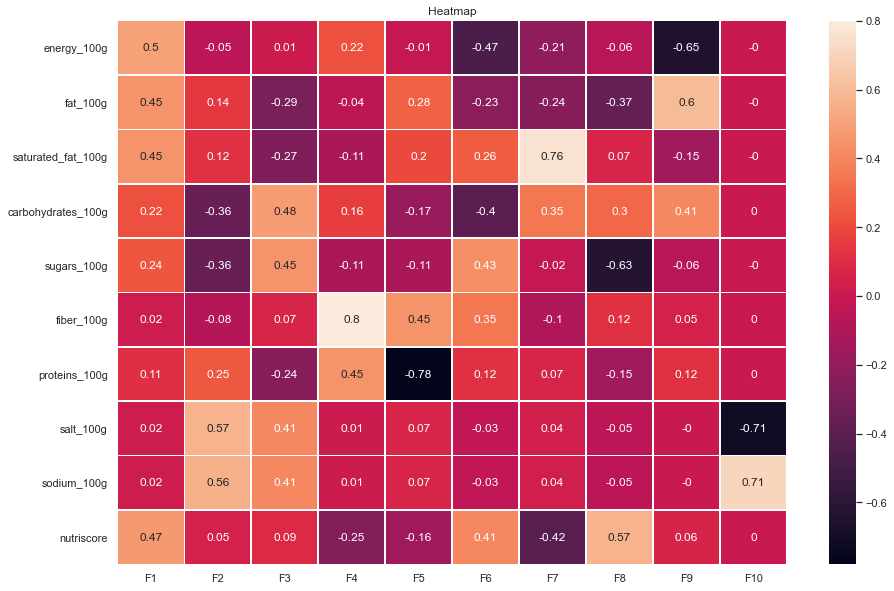

In [56]:
fc.heat_map(pcs.round(2).T)

Cette représentation en heatmap est plus visuelle et nous permet de constater quelles variables sont les plus impliquées dans le calcul de chaque composante.

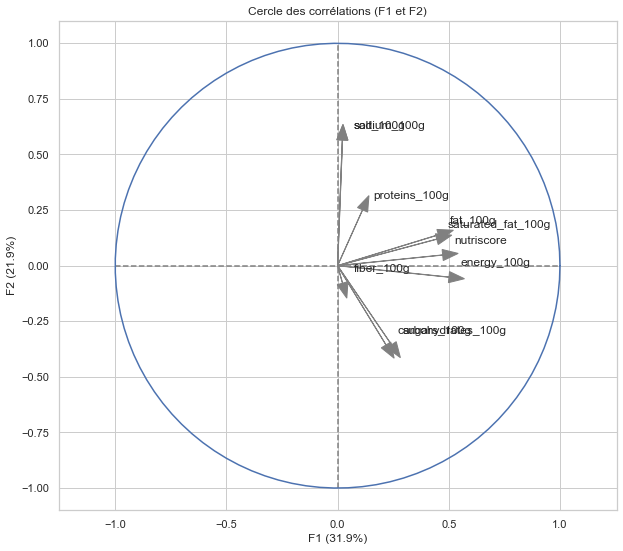

In [57]:
fc.correlation_graph(pca, 0, 1, col_num)

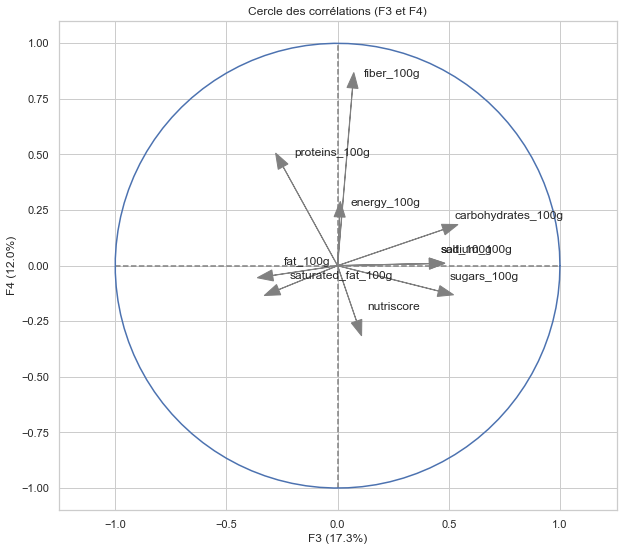

In [58]:
fc.correlation_graph(pca, 2, 3, col_num)

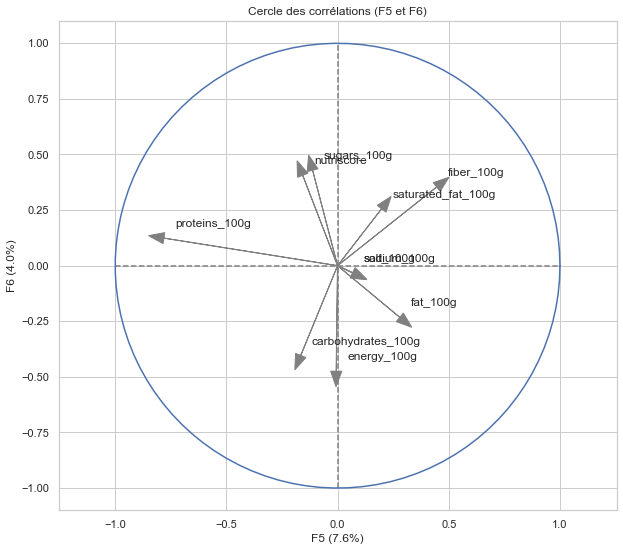

In [59]:
fc.correlation_graph(pca, 4, 5, col_num)

Nous allons interpréter la signification de nos 6 composantes. Pour cela, nous allons nous aider des cercles de corrélations mais également de la heatmap.

- F1 : corrélée positivement avec les variables d'énergie, de gras et le nutriscore -> un produit avec des valeurs importantes dans ces variables sera gras et calorique (donc généralement mauvais pour la santé).
- F2 : corrélée positivement avec les variables de sel (et sodium) et les protéines, et négativement avec les variables de glucides (dont sucres) -> elle semble opposer les produits sucrés et salés.
- F3 : corrélée positivement avec les variables de glucides et de sel et négativement avec les variables de gras -> elle semble opposer les produits riches en sucre et sel avec ceux riches en gras. 
- F4 : corrélée positivement avec les variables fibres, protéines et énergie et négativement avec le nutriscore -> elle semble opposer les produits sains aux produits non sains (un nutriscore élevé = qualité nutritionnelle moindre).
- F5 : corrélée positivement avec les variables de sel, gras et fibres et négativement avec la variable protéines -> elle semble  opposer les produits riches en sel, gras et fibres aux produits riches en protéines.
- F6 : corrélée positivement avec les variables sucres et nutriscore et négativement avec les glucides et l'énergie -> elle semble opposer les produits riches en sucres lents et énergie aux produits riches en sucres et que qualité nutritionnelle moindre.

In [60]:
X_proj = pca.transform(X_scaled)

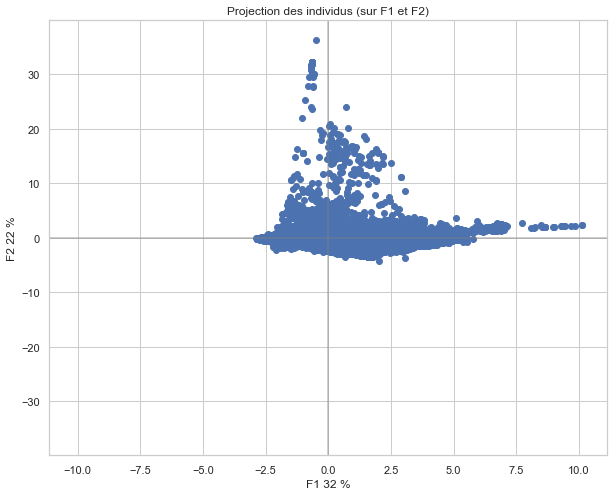

In [61]:
fc.plan_factoriel(X_proj,0,1,pca)

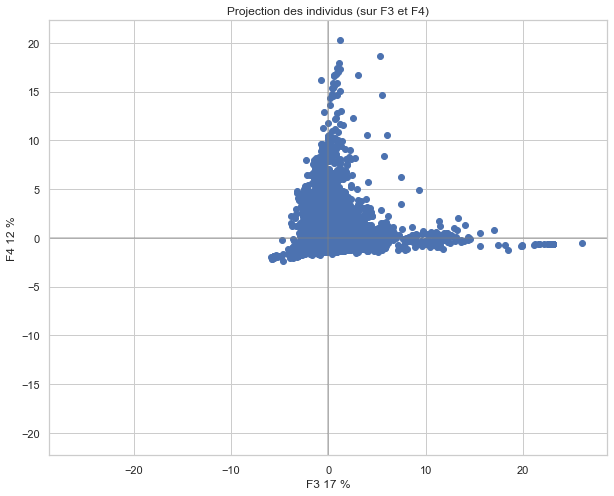

In [62]:
fc.plan_factoriel(X_proj,2,3,pca)

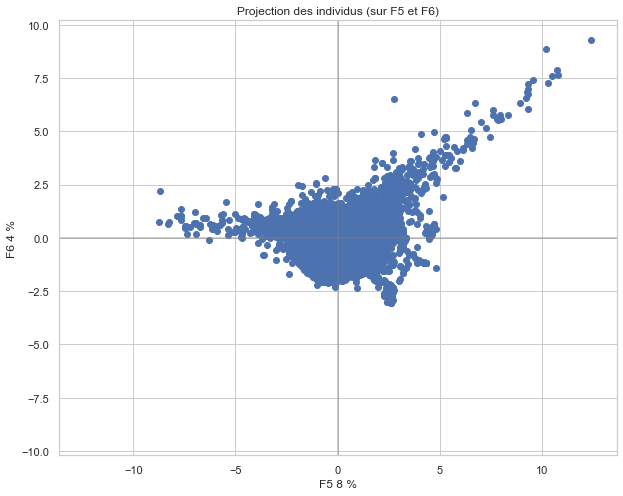

In [63]:
fc.plan_factoriel(X_proj,4,5,pca)

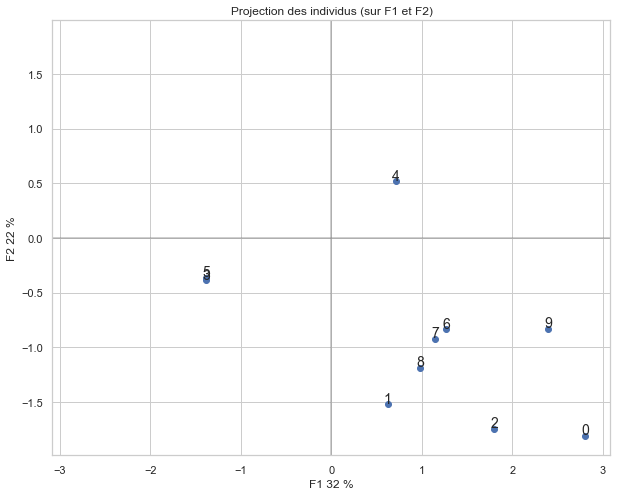

In [64]:
fc.plan_factoriel(X_proj[:10],0,1,pca, labels = data.index)

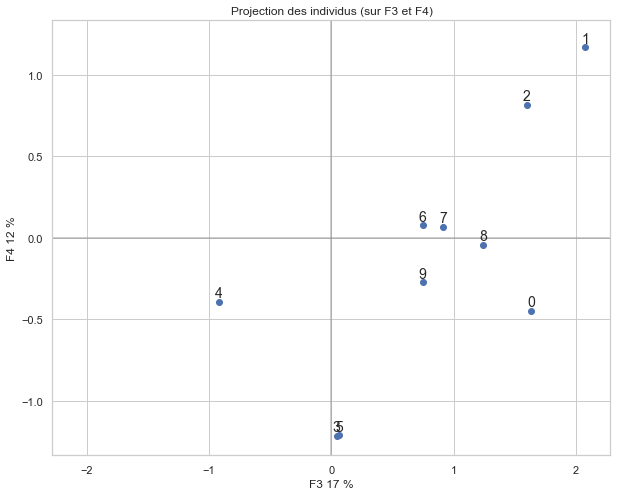

In [65]:
fc.plan_factoriel(X_proj[:10],2,3,pca, labels = data.index)

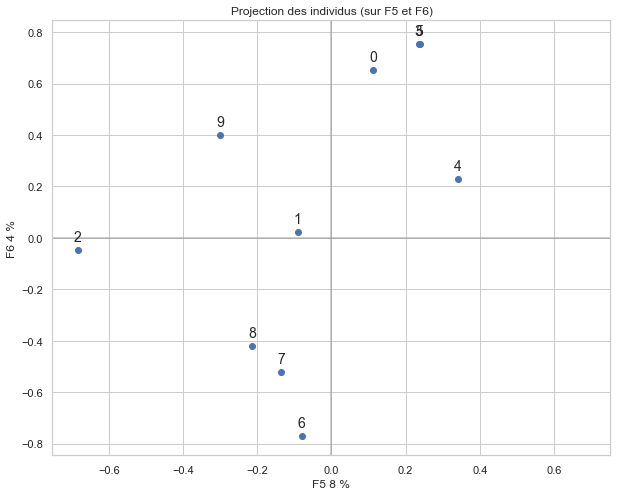

In [66]:
fc.plan_factoriel(X_proj[:10],4,5,pca, labels = data.index)

In [67]:
%matplotlib inline

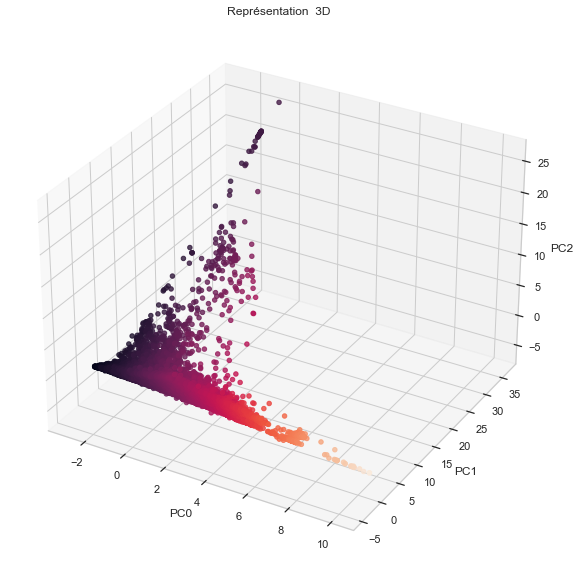

In [68]:
fc.graph_3D(X_proj,[0,1,2])

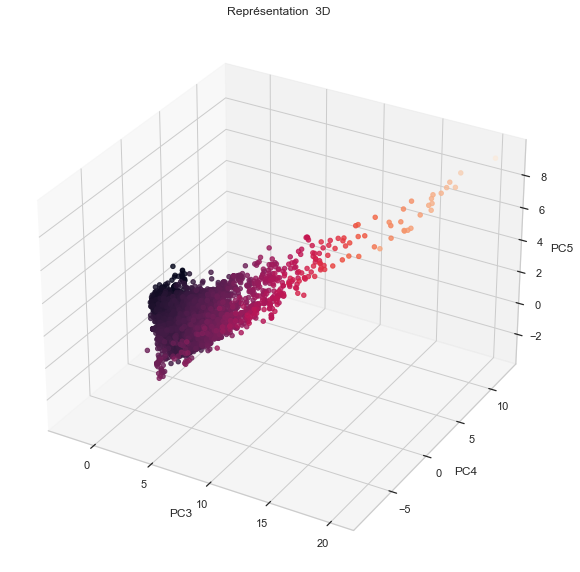

In [69]:
fc.graph_3D(X_proj,[3,4,5])